In [1]:
import torch
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import tqdm
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scipy.ndimage as sim
import scipy.ndimage as sim


import mltools.utils.cuda_tools as cuda_tools
from mltools.networks import networks

device=cuda_tools.get_freer_device()

import sys
sys.path.append('../')

import utils
import models
import importlib
importlib.reload(utils)

plt.rcParams.update({'font.size': 18})

memory_available [81034]
best GPU: 0


In [2]:
fols=[]
sep_cols=[]
for fol in glob.glob("../data/images_1/2x2_MI/mirun_1/*/*"):
    seed=int(fol.split("seed=")[1])
    parentfolname=os.path.basename(os.path.dirname(fol))
    sep_col=parentfolname.split("sep_col=")[1].split("_")[0]
    fols.append(fol)
    sep_cols.append(float(sep_col))
#sort by sep_col
fols=[f for _,f in sorted(zip(sep_cols,fols))]

In [1923]:
suffix=""
plot_datass={}
c=0
for fol in fols:
    seed=int(fol.split("seed=")[1])
    parentfolname=os.path.basename(os.path.dirname(fol))
    sep_col=parentfolname.split("sep_col=")[1].split("_")[0]
    sep_size=parentfolname.split("sep_size=")[1].split("_")[0]
    config_file=glob.glob(os.path.join(fol,"*.yaml"))[0]
    config=utils.load_config(config_file)
    plot_data_file=os.path.join(fol,f"plot_data{suffix}.pth")
    plot_data=torch.load(plot_data_file)
    plot_data["seed"]=seed
    plot_data["sep_col"]=sep_col
    plot_data["sep_size"]=sep_size
    prompt_accs=os.path.join(fol,"prompt_accs.pth")
    prompt_accs=torch.load(prompt_accs)['promptaccs'].prod(-2).mean(-1).max(1)
    plot_data["prompt_accs"]=prompt_accs
    plot_datass.setdefault((sep_col,sep_size),[]).append(plot_data)
    c+=1
len(plot_datass),c

(6, 30)

In [1902]:
plot_datass.keys()

dict_keys([('0.175', '0.4'), ('0.2', '0.4'), ('0.225', '0.4'), ('0.25', '0.4'), ('0.275', '0.4'), ('0.3', '0.4')])

In [1903]:
plot_datas=plot_datass[list(plot_datass.keys())[0]]
save_steps=np.array(plot_datas[0]["save_steps"])
steps=save_steps

In [1904]:
cmap="rainbow"
norm = mcolors.Normalize(vmin=0.175, vmax=0.3)
def sep_col_to_color(sep_col,cmap="gnuplot"):
    return matplotlib.colormaps[cmap](norm(float(sep_col)))

In [1905]:
sel=["0.175","0.2","0.225","0.25","0.275","0.3"]

min step 134
star step [2686]


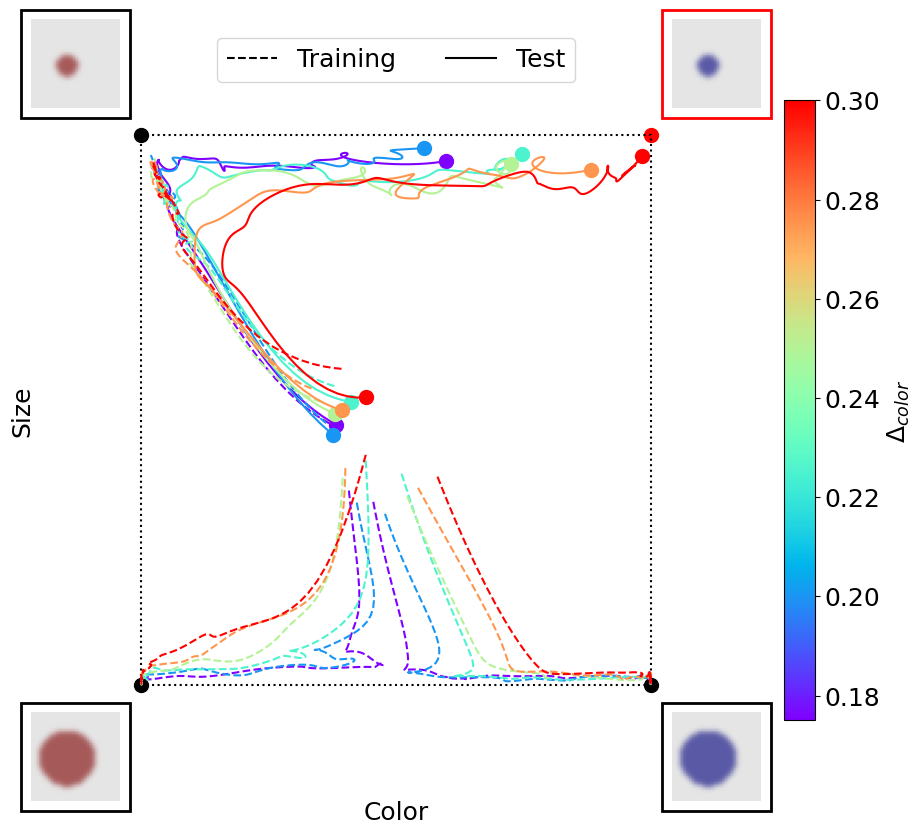

In [1930]:
plt.figure(figsize=(10,10))
plt.plot([0,1,1,0,0,0],[0,0,1,1,0,0],c="k",ls=":")
plt.scatter([0,0,1],[0,1,0],c="k",s=100)
plt.scatter([1],[1],c="r",s=100)

i_step_min=1
print("min step",save_steps[i_step_min])

sigma_smooth=5.0

plot_mean=True
seeds_avg=[0,100,200,300,400]

plot_train=True

plot_star=False
i_stars=[20]#[60,70,80,90]
print("star step",save_steps[i_stars])

plot_singles=False
single_seeds=[0,100,200,300,400]

tr_accs=[]
trajs_trss=[]
te_accs=[]
trajs_tess=[]
sep_cols=[]
sep_sizes=[]
for key in plot_datass.keys():
    sep_col=key[0]
    sep_size=key[1]
    #cfg=float(key[2])
    sep_cols.append(float(sep_col))
    sep_sizes.append(float(sep_size))
    #if  sep_col!="0.2" or sep_size!="0.3":
    #    continue
    if sep_col not in sel:
        continue
    plot_datas=plot_datass[key]
    classprobs_pred_trs=[]
    classprobs_pred_tes=[]
    seeds=[]
    for plot_data in plot_datas:
        if plot_data["seed"] not in seeds_avg:
            continue
        classprobs_pred_tr=np.array(plot_data['classprobs_pred_tr'])[...,1]
        l_tr=np.array(plot_data['l_tr'])
        classprobs_pred_trs.append(classprobs_pred_tr)
        classprobs_pred_te=np.array(plot_data['classprobs_pred_te'])[...,1]
        classprobs_pred_tes.append(classprobs_pred_te)
        l_te=np.array(plot_data['l_te'])
        seeds.append(plot_data["seed"])
    classprobs_pred_trs=np.stack(classprobs_pred_trs,axis=0)
    classprobs_pred_tes=np.stack(classprobs_pred_tes,axis=0)
    #loop for tr
    trajs_trs=[]
    tr_accs_=[]
    for i in range(3):
        trajs_trs.append(classprobs_pred_trs[:,:,:,l_tr==i].mean((0,3)))
        gt=np.array([[0,0],[0,1],[1,0]][i])
        tr_accs_.append(1-np.abs(gt[None,None,:,None]-classprobs_pred_trs[:,:,:,l_tr==i]).mean(3))
    trajs_trs=np.stack(trajs_trs,axis=0)
    tr_accs.append(np.stack(tr_accs_,axis=0))
    #in 2D only 1 test
    te_accs.append(classprobs_pred_tes[:,:,:,l_te==3].mean(3))
    trajs_te=classprobs_pred_tes[:,:,:,l_te==3].mean((0,3))

    trajs_trs=sim.gaussian_filter1d(trajs_trs,sigma_smooth,axis=1,truncate=6.0)
    trajs_te=sim.gaussian_filter1d(trajs_te,sigma_smooth,axis=0,truncate=6.0)
    trajs_trss.append(trajs_trs)
    trajs_tess.append(trajs_te)
    color=sep_col_to_color(sep_col,cmap=cmap)
    #color=cfg_to_color(cfg,cmap=cmap)
    #i_stars=[np.argmax(tr_accs[-1].prod(-1).mean((0,1))>0.9)]
    if plot_mean:
        plt.plot(trajs_te[i_step_min:,0],trajs_te[i_step_min:,1],c=color)
        plt.plot(trajs_te[i_step_min,0],trajs_te[i_step_min,1],marker="o",c=color,markersize=10)
        plt.plot(trajs_te[-1,0],trajs_te[-1,1],marker="o",c=color,markersize=10)
        if plot_train:
            for i in range(3):
                plt.plot(trajs_trs[i,i_step_min:,0],trajs_trs[i,i_step_min:,1],ls="--",c=color)
        if plot_star:
            plt.plot(trajs_te[i_stars,0],trajs_te[i_stars,1],marker="*",c="r",markersize=20)
            if plot_train:
                for i in range(3):
                    plt.plot(trajs_trs[i,i_stars,0],trajs_trs[i,i_stars,1],marker="*",c="r",markersize=20)

    if plot_singles:
        for i_seed,traj_te_single in enumerate(classprobs_pred_tes[:,:,:,l_te==3].mean(3)):
            seed=seeds[i_seed]
            if seed not in single_seeds:
                continue
            traj_smooth=sim.gaussian_filter1d(traj_te_single,sigma_smooth,axis=0,truncate=6.0)
            plt.plot(traj_smooth[i_step_min:,0],traj_smooth[i_step_min:,1],c=color,alpha=0.3)
            #plt.annotate(str(seed),(traj_smooth[-1,0],traj_smooth[-1,1]),c=color)
        if plot_train:
            for i in range(3):
                for i_seed,traj_tr_single in enumerate(classprobs_pred_trs[:,:,:,l_tr==i].mean(3)):
                    seed=seeds[i_seed]
                    if seed not in single_seeds:
                        continue
                    traj_smooth=sim.gaussian_filter1d(traj_tr_single,sigma_smooth,axis=0,truncate=6.0)
                    plt.plot(traj_smooth[i_step_min:,0],traj_smooth[i_step_min:,1],c=color,alpha=0.1)
                    #plt.annotate(str(seed),(traj_smooth[-1,0],traj_smooth[-1,1]),c=color)
        if plot_star:
            for i_seed,traj_te_single in enumerate(classprobs_pred_tes[:,:,:,l_te==3].mean(3)):
                seed=seeds[i_seed]
                if seed not in single_seeds:
                    continue
                traj_smooth=sim.gaussian_filter1d(traj_te_single,sigma_smooth,axis=0,truncate=6.0)
                plt.plot(traj_smooth[i_stars,0],traj_smooth[i_stars,1],marker="*",c="r",markersize=20)
            if plot_train:
                for i in range(3):
                    for i_seed,traj_tr_single in enumerate(classprobs_pred_trs[:,:,:,l_tr==i].mean(3)):
                        seed=seeds[i_seed]
                        if seed not in single_seeds:
                            continue
                        traj_smooth=sim.gaussian_filter1d(traj_tr_single,sigma_smooth,axis=0,truncate=6.0)
                        plt.plot(traj_smooth[i_stars,0],traj_smooth[i_stars,1],marker="*",c="r",markersize=20)
tr_accs=np.stack(tr_accs,axis=0)
te_accs=np.stack(te_accs,axis=0)
trajs_trss=np.stack(trajs_trss,axis=0)
trajs_tess=np.stack(trajs_tess,axis=0)
sep_cols=np.array(sep_cols)
plt.xlim(-0.2,1.2)
plt.ylim(-0.2,1.2)
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.ylabel("Size")
plt.xlabel("Color")
plt.plot([],[],c="k",ls="--",label="Training")
plt.plot([],[],c="k",label="Test")
plt.legend(loc="upper center",ncol=2)

cbar=plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm),ax=plt.gca(),fraction=0.04, pad=0.04)
cbar.set_label(r"$\Delta_{color}$")

config["n_samples_train"]=[0]*4
config["n_samples_test"]=[0]*4
config["n_samples_train_gen"]=[0]*4
config["n_samples_test_gen"]=[32]*4
x_tr,y_tr,l_tr,x_te,y_te,l_te=utils.generate_data(config,forgen=True,seed=42)
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
for l in [0,1,2,3]:
    i=16
    image=x_te[l_te==l][i].transpose(2,1,0)
    imagebox = OffsetImage(image, zoom = 2.0)
    s=0.13
    coord={0:[0.-s,0.-s],1:[0.-s,1.+s],2:[1.+s,0.-s],3:[1.+s,1.+s]}[l]
    ab = AnnotationBbox(imagebox, coord, frameon = True ,bboxprops=dict(edgecolor="k" if l in [0,1,2] else "r",lw=2))
    plt.gca().add_artist(ab)

plt.savefig(f"../figures/icml/concept_space.png",bbox_inches="tight")

[[0.5875, 0.4125, 0.4125], [0.4125, 0.4125, 0.5875]]
[[0.65, 0.35, 0.35], [0.35, 0.35, 0.65]]


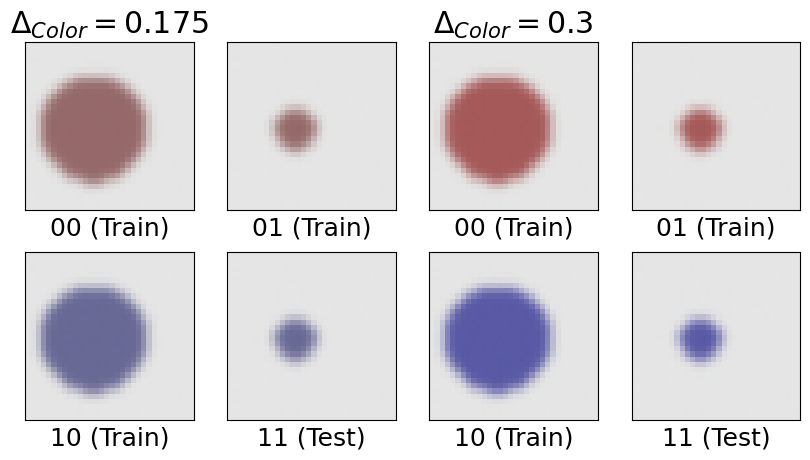

In [1907]:
fol1=fols[0]
config_file=glob.glob(os.path.join(fol1,"*.yaml"))[0]
config=utils.load_config(config_file)
config["n_samples_train"]=[0]*4
config["n_samples_test"]=[0]*4
config["n_samples_train_gen"]=[0]*4
config["n_samples_test_gen"]=[32]*4
print(config["data_params"]["color"]["means"])
x_tr1,y_tr1,l_tr1,x_te1,y_te1,l_te1=utils.generate_data(config,forgen=True,seed=42)
fol2=fols[-1]
config_file=glob.glob(os.path.join(fol2,"*.yaml"))[0]
config=utils.load_config(config_file)
config["n_samples_train"]=[0]*4
config["n_samples_test"]=[0]*4
config["n_samples_train_gen"]=[0]*4
config["n_samples_test_gen"]=[32]*4
print(config["data_params"]["color"]["means"])
x_tr2,y_tr2,l_tr2,x_te2,y_te2,l_te2=utils.generate_data(config,forgen=True,seed=42)
plt.figure(figsize=(10,5))
i=16
plt.subplot(2,4,1)
plt.imshow(x_te1[l_te1==0][i].transpose(2,1,0))
plt.title("$\Delta_{Color}=0.175$")
plt.xlabel("00 (Train)")
plt.subplot(2,4,2)
plt.imshow(x_te1[l_te1==1][i].transpose(2,1,0))
plt.xlabel("01 (Train)")
plt.subplot(2,4,3)
plt.imshow(x_te2[l_te2==0][i].transpose(2,1,0))
plt.title("$\Delta_{Color}=0.3$")
plt.xlabel("00 (Train)")
plt.subplot(2,4,4)
plt.imshow(x_te2[l_te2==1][i].transpose(2,1,0))
plt.xlabel("01 (Train)")
plt.subplot(2,4,5)
plt.imshow(x_te1[l_te1==2][i].transpose(2,1,0))
plt.xlabel("10 (Train)")
plt.subplot(2,4,6)
plt.imshow(x_te1[l_te1==3][i].transpose(2,1,0))
plt.xlabel("11 (Test)")
plt.subplot(2,4,7)
plt.imshow(x_te2[l_te2==2][i].transpose(2,1,0))
plt.xlabel("10 (Train)")
plt.subplot(2,4,8)
plt.imshow(x_te2[l_te2==3][i].transpose(2,1,0))
plt.xlabel("11 (Test)")
for ax in plt.gcf().axes:
    ax.set_xticks([])
    ax.set_yticks([])
plt.savefig(f"../figures/icml/concept_space_examples.png",bbox_inches="tight")

In [1931]:
c_te_accs=te_accs

In [1932]:
sep_cols=[]
sep_sizes=[]
tr_accs=[]
te_accs=[]
te_accs_prompt=[]
for key in plot_datass.keys():
    sep_col=key[0]
    sep_size=key[1]
    sep_cols.append(float(sep_col))
    sep_sizes.append(float(sep_size))

    plot_datas=plot_datass[key]
    tr_accs_=[]
    te_accs_=[]
    te_accs_prompt_=[]
    for plot_data in plot_datas:
        rights_tr=np.array(plot_data['rights_tr']).prod(-1)
        rights_te=np.array(plot_data['rights_te']).prod(-1)
        tr_accs_.append(rights_tr.mean(1))
        te_accs_.append(rights_te.mean(1))
        te_accs_prompt_.append(plot_data['prompt_accs'])
    tr_accs_=np.stack(tr_accs_,axis=0)
    te_accs_=np.stack(te_accs_,axis=0)
    te_accs_prompt_=np.stack(te_accs_prompt_,axis=0)
    tr_accs.append(tr_accs_)
    te_accs.append(te_accs_)
    te_accs_prompt.append(te_accs_prompt_)
steps=np.array(plot_datas[0]["save_steps"])
tr_accs=np.stack(tr_accs,axis=0)
te_accs=np.stack(te_accs,axis=0)
te_accs_prompt=np.stack(te_accs_prompt,axis=0)
sep_cols=np.array(sep_cols)
sep_sizes=np.array(sep_sizes)
tr_accs.shape,te_accs.shape,te_accs_prompt.shape

((6, 5, 220), (6, 5, 220), (6, 5, 220))

In [1933]:
fol=fols[15]
fol

'../data/images_1/2x2_MI/mirun_1/sep_col=0.25_sep_size=0.4/seed=0'

In [1934]:
logs=torch.load(os.path.join(fol,"logs.pth"))

In [1950]:
logs["save_steps"][110]

6169

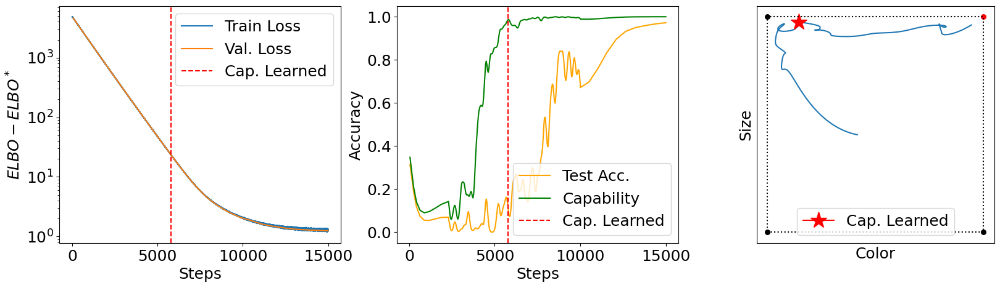

In [1970]:
tr_accs_=sim.gaussian_filter1d(tr_accs[3,0],2.0,truncate=6.0)
te_accs_=sim.gaussian_filter1d(te_accs[3,0],2.0,truncate=6.0)
te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[3,0],2.0,truncate=6.0)

i=100

plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.plot(logs["online_losses"]-logs["min_vlb"],label="Train Loss")
plt.plot(logs["save_steps"],logs["val_losses"]-logs["min_vlb"],label="Val. Loss")
plt.axvline(logs["save_steps"][i],c="r",ls="--",label="Cap. Learned")
plt.ylabel("$ELBO-ELBO^*$")
plt.xlabel("Steps")
plt.yscale("log")
plt.legend()
plt.subplot(1,3,2)
#plt.plot(steps,tr_accs_,label="Train Acc.",ls="--",c="b")
plt.plot(steps,te_accs_,label="Test Acc.",c="orange")
plt.plot(steps,te_accs_prompt_,label="Capability",c="g")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.axvline(logs["save_steps"][i],c="r",ls="--",label="Cap. Learned")
plt.legend(loc="lower right")
plt.subplot(1,3,3)
traj=sim.gaussian_filter1d(c_te_accs[3,0],5.0,axis=0,truncate=6.0)
plt.plot(traj[:,0],traj[:,1])
plt.plot(traj[i,0],traj[i,1],marker="*",markersize=20,c="r",label="Cap. Learned")
plt.scatter([0,0,1],[0,1,0],c="k",s=30)
plt.scatter([1],[1],c="r",s=30)
plt.plot([0,1,1,0,0,0],[0,0,1,1,0,0],c="k",ls=":")
plt.xticks([])
plt.yticks([])
plt.xlabel("Color")
plt.ylabel("Size")
plt.gca().set_aspect("equal")
plt.legend()
#plt.plot(steps,te_accs_prompt_,label="Prompt",c="r")
plt.savefig(f"../figures/icml/capability_learning_iden.png",bbox_inches="tight")

In [1936]:
c_te_accs.shape

(6, 5, 220, 2)

In [ ]:
c_te_accs[3,0,:,0]

In [1746]:
cmap="rainbow"
norm = mcolors.Normalize(vmin=0.175, vmax=0.3)
def sep_col_to_color(sep_col,cmap="gnuplot"):
    return matplotlib.colormaps[cmap](norm(float(sep_col)))

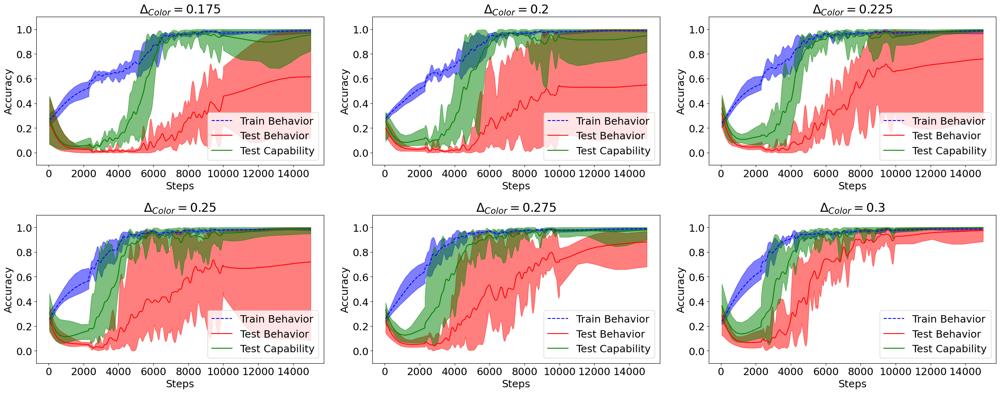

In [1928]:
plt.figure(figsize=(25,10))
for i_setting in range(6):
    plt.subplot(2,3,i_setting+1)
    """
    tr_accs_mean=sim.gaussian_filter1d(tr_accs[i_setting].mean(0),2.0,axis=0,truncate=6.0)
    tr_accs_min=sim.gaussian_filter1d(tr_accs[i_setting].min(0),2.0,axis=0,truncate=6.0)
    tr_accs_max=sim.gaussian_filter1d(tr_accs[i_setting].max(0),2.0,axis=0,truncate=6.0)

    te_accs_mean=sim.gaussian_filter1d(te_accs[i_setting].mean(0),2.0,axis=0,truncate=6.0)
    te_accs_min=sim.gaussian_filter1d(te_accs[i_setting].min(0),2.0,axis=0,truncate=6.0)
    te_accs_max=sim.gaussian_filter1d(te_accs[i_setting].max(0),2.0,axis=0,truncate=6.0)

    te_accs_prompt_mean=sim.gaussian_filter1d(te_accs_prompt[i_setting].mean(0),2.0,axis=0,truncate=6.0)
    te_accs_prompt_min=sim.gaussian_filter1d(te_accs_prompt[i_setting].min(0),2.0,axis=0,truncate=6.0)
    te_accs_prompt_max=sim.gaussian_filter1d(te_accs_prompt[i_setting].max(0),2.0,axis=0,truncate=6.0)
    """

    #"""
    tr_accs_s=sim.gaussian_filter1d(tr_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_s=sim.gaussian_filter1d(te_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    tr_accs_mean=tr_accs_s.mean(0)
    tr_accs_min,tr_accs_max=tr_accs_s.min(0),tr_accs_s.max(0)
    te_accs_mean=te_accs_s.mean(0)
    te_accs_min,te_accs_max=te_accs_s.min(0),te_accs_s.max(0)
    te_accs_prompt_mean=te_accs_prompt_s.mean(0)
    te_accs_prompt_min,te_accs_prompt_max=te_accs_prompt_s.min(0),te_accs_prompt_s.max(0)
    #"""

    plt.plot(steps,tr_accs_mean,c="b",ls="--",label="Train Behavior")
    plt.fill_between(steps,tr_accs_min,tr_accs_max,alpha=0.5,color="b")

    plt.plot(steps,te_accs_mean,c="r",label="Test Behavior")
    plt.fill_between(steps,te_accs_min,te_accs_max,alpha=0.5,color="r")

    plt.plot(steps,te_accs_prompt_mean,c="g",label="Test Capability")
    plt.fill_between(steps,te_accs_prompt_min,te_accs_prompt_max,alpha=0.5,color="g")

    #plt.plot(steps,tr_accs_smooth.mean(0),c="b",ls="--",label="Train Behavior")
    #plt.fill_between(steps,tr_accs_low,tr_accs_high,alpha=0.5,color="b")
    #plt.plot(steps,te_accs_smooth.mean(0),c="r",label="Test Behavior")
    #plt.fill_between(steps,te_accs_low,te_accs_high,alpha=0.5,color="r")
    #plt.plot(steps,te_accs_prompt_smooth.mean(0),c="g",label="Capability")
    #plt.fill_between(steps,te_accs_prompt_low,te_accs_prompt_high,alpha=0.5,color="g")

    plt.title("$\Delta_{Color}=$"+f"{sep_cols[i_setting]}")#, "+"$\Delta_{Size}=$"+f"{sep_sizes[i_setting]}")

    plt.legend()

    plt.xlabel("Steps")
    #plt.xscale("log")
    #plt.xlim(left=500)

    plt.ylabel("Accuracy")
    plt.ylim(-0.1,1.1)
    plt.yticks([0,0.2,0.4,0.6,0.8,1.0])
plt.tight_layout()
#plt.savefig("../figures/icml/capability_vs_behavior.png")

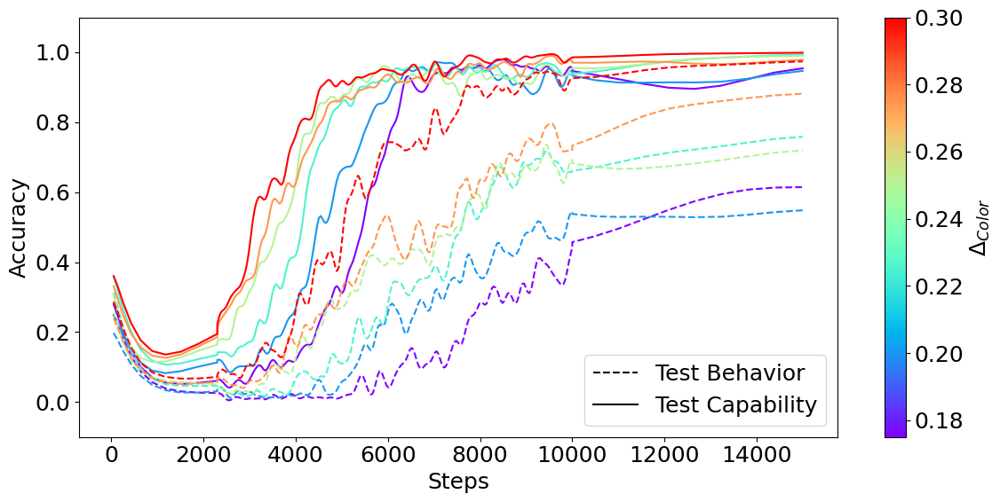

In [1748]:
plt.figure(figsize=(12,6))
plt.subplot(1,1,1)
for i_setting in range(6):
    tr_accs_s=sim.gaussian_filter1d(tr_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_s=sim.gaussian_filter1d(te_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    tr_accs_mean=tr_accs_s.mean(0)
    #tr_accs_min,tr_accs_max=tr_accs_s.min(0),tr_accs_s.max(0)
    te_accs_mean=te_accs_s.mean(0)
    te_accs_min,te_accs_max=te_accs_s.min(0),te_accs_s.max(0)
    te_accs_prompt_mean=te_accs_prompt_s.mean(0)
    te_accs_prompt_min,te_accs_prompt_max=te_accs_prompt_s.min(0),te_accs_prompt_s.max(0)

    c=sep_col_to_color(sep_cols[i_setting],cmap=cmap)
    #plt.plot(steps,tr_accs_mean,c=c,ls="--")
    plt.plot(steps,te_accs_mean,c=c,ls="--")
    plt.plot(steps,te_accs_prompt_mean,c=c)
plt.plot([],[],c="k",ls="--",label="Test Behavior")
plt.plot([],[],c="k",label="Test Capability")
cbar=plt.colorbar(plt.cm.ScalarMappable(norm=norm,cmap=cmap),ax=plt.gca())
cbar.set_label("$\Delta_{Color}$")
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.ylim(-0.1,1.1)
plt.yticks([0,0.2,0.4,0.6,0.8,1.0])
#plt.title("Test Behavior and Ability")
plt.tight_layout()
plt.savefig("../figures/icml/capability_vs_behavior_color.png")

In [1749]:
thres=0.5
ts_tr=[]
ts=[]
t_prompts=[]
for i_setting in range(6):
    tr_accs_s=sim.gaussian_filter1d(tr_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_s=sim.gaussian_filter1d(te_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    tr_accs_mean=tr_accs_s.mean(0)
    te_accs_mean=te_accs_s.mean(0)
    te_accs_prompt_mean=te_accs_prompt_s.mean(0)
    if np.sum(tr_accs_mean>thres)==0:
        t_tr=np.nan
    else:
        t_tr=steps[np.argmax(tr_accs_mean>thres)]
    ts_tr.append(t_tr)
    if np.sum(te_accs_mean>thres)==0:
        t=np.nan
    else:
        t=steps[np.argmax(te_accs_mean>thres)]
    if np.sum(te_accs_prompt_mean>thres)==0:
        t_prompt=np.nan
    else:
        t_prompt=steps[np.argmax(te_accs_prompt_mean>thres)]
    ts.append(t)
    t_prompts.append(t_prompt)
ts_tr=np.array(ts_tr)
ts=np.array(ts)
t_prompts=np.array(t_prompts)
ts_tr,ts,t_prompts

(array([2299, 1884, 1884, 1510, 1510, 1510]),
 array([11555,  9187,  7639,  7523,  5821,  5047]),
 array([5472, 4466, 4157, 3615, 3383, 3073]))

In [1750]:
from scipy.optimize import curve_fit
def linfunc(x,a,b):
    return a*x+b

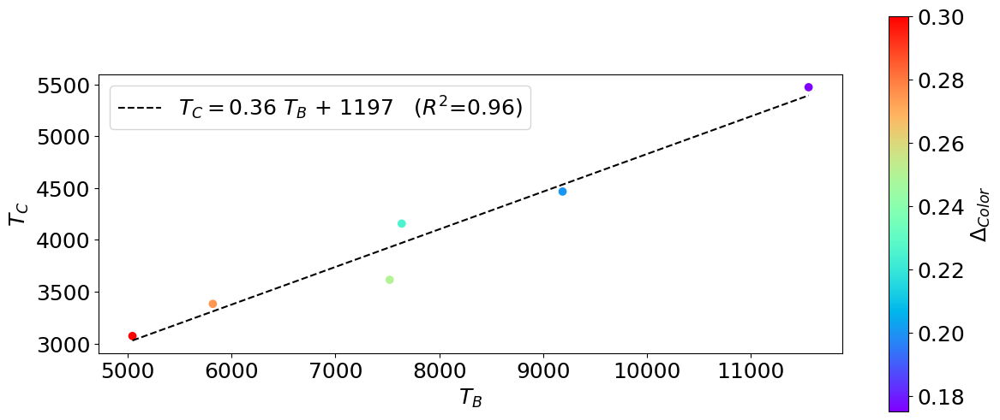

In [1751]:
popt,pcov=curve_fit(linfunc,ts,t_prompts)
slope=popt[0]
intercept=popt[1]
rsq=np.corrcoef(ts,t_prompts)[0,1]**2
plt.figure(figsize=(14,6))
plt.scatter(ts,t_prompts,c=sep_cols,cmap=cmap)
plt.gca().set_aspect('equal')
x_=np.linspace(ts.min(),ts.max(),100)
plt.plot(x_,slope*x_+intercept,c="k",ls="--",label="$T_C=$"+f"{slope:.2f} "+"$T_B$"+f" + {intercept:.0f} "+"  ("+"$R^2$"+f"={rsq:.2f})")
plt.legend()
plt.xlabel("$T_B$")
plt.ylabel("$T_C$")
cb=plt.colorbar()
cb.set_label("$\Delta_{Color}$")
plt.savefig("../figures/icml/t_prompts_vs_ts.png")

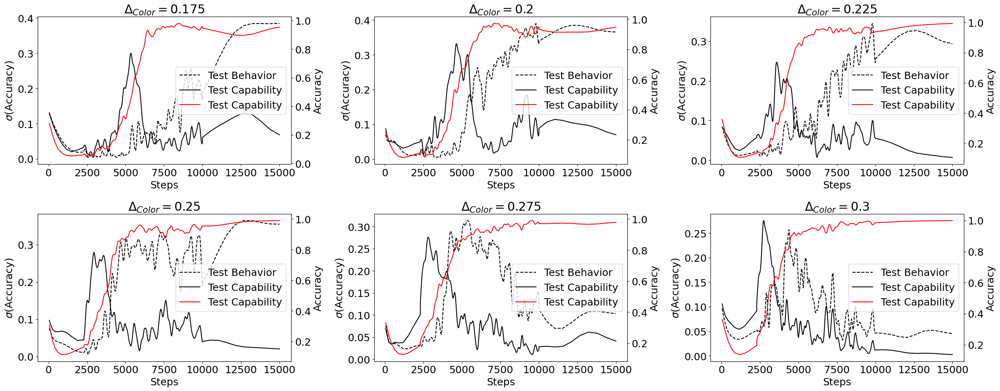

In [1752]:
plt.figure(figsize=(25,10))
for i_setting in range(6):
    plt.subplot(2,3,i_setting+1)
    tr_accs_s=sim.gaussian_filter1d(tr_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_s=sim.gaussian_filter1d(te_accs[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    tr_accs_mean=tr_accs_s.mean(0)
    #tr_accs_min,tr_accs_max=tr_accs_s.min(0),tr_accs_s.max(0)
    #te_accs_mean=te_accs_s.mean(0)
    te_accs_std=te_accs_s.std(0)
    #te_accs_min,te_accs_max=te_accs_s.min(0),te_accs_s.max(0)
    te_accs_prompt_mean=te_accs_prompt_s.mean(0)
    te_accs_prompt_std=te_accs_prompt_s.std(0)
    #te_accs_prompt_min,te_accs_prompt_max=te_accs_prompt_s.min(0),te_accs_prompt_s.max(0)

    c="k"#sep_col_to_color(sep_cols[i_setting],cmap=cmap)
    plt.plot(steps,te_accs_std,c=c,ls="--")
    plt.plot(steps,te_accs_prompt_std,c=c)
    plt.title("$\Delta_{Color}=$"+f"{sep_cols[i_setting]}")
    plt.plot([],[],c="k",ls="--",label="Test Behavior")
    plt.plot([],[],c="k",label="Test Capability")
    plt.plot([],[],c="r",label="Test Capability") 
    plt.legend(loc="center right")
    plt.xlabel("Steps")
    plt.ylabel("$\sigma$"+"(Accuracy)")
    plt.twinx()
    plt.plot(steps,te_accs_prompt_mean,c="r")
    plt.ylabel("Accuracy")
plt.tight_layout()
plt.savefig("../figures/icml/capability_vs_behavior_std.png")

(2338, 9883)

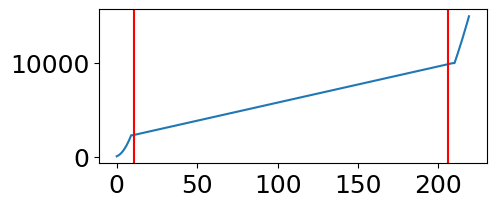

In [1753]:
plt.figure(figsize=(5,2))
i_start=11
i_end=206
plt.plot(steps)
plt.axvline(i_start,c="r")
plt.axvline(i_end,c="r")
steps[i_start],steps[i_end]

In [1754]:
classifier_ckpt_path="../data/images_1/2x2_final2/classifier_combined.pth"
n_classes=[2,2]
net=networks.CUNet(shape=(3,32,32),out_channels=64,chs=[32,32,32],norm_groups=4)
classifier=models.Classifier(net=net,n_classes=n_classes)
classifier=classifier.to(device)
classifier.load_state_dict(torch.load(classifier_ckpt_path))
classifier=classifier.eval()

In [1755]:
for fol in glob.glob("../data/images_1/2x2_MI/mirun_1/*/*"):
    seed=int(fol.split("seed=")[1])
    config=utils.load_config(glob.glob(os.path.join(fol,"*.yaml"))[0])
    break
config["data_params"]["color"]["means"],config["data_params"]["size"]["means"]

([[0.625, 0.375, 0.375], [0.375, 0.375, 0.625]], [0.65, 0.25])

In [1770]:
def get_step(ckpt):
    return int(ckpt.split("ckpt_step=")[1].split(".pth")[0])


eval_stepss=[]
mlp_weights_color_norms=[]
mlp_weights_size_norms=[]
mlp_grad_color_norms=[]
mlp_grad_size_norms=[]
conv_weights_norms=[]
conv_grad_norms=[]
simil_diffs1s=[]
simil_diffs2s=[]

for fol in fols:
    seed=int(fol.split("seed=")[1])
    parentfolname=os.path.basename(os.path.dirname(fol))
    print(parentfolname)
    sep_col=parentfolname.split("sep_col=")[1].split("_")[0]
    #if sep_col!="0.174" or seed!=200:
    #    continue
    #print(sep_col)

    config=utils.load_config(glob.glob(os.path.join(fol,"*.yaml"))[0])
    ckpt_paths=glob.glob(os.path.join(fol,"ckpts","*.pth"))
    ckpt_paths=np.array(sorted(ckpt_paths,key=get_step))#[i_start:i_end]

    model=utils.get_model(config)
    model.to(device)
    model=model.eval()

    config["n_samples_train"]=[0]*8
    config["n_samples_test"]=[0]*8
    config["n_samples_train_gen"]=[64]*8
    config["n_samples_test_gen"]=[0]*8
    x_tr,y_tr,l_tr,x_te,y_te,l_te=utils.generate_data(config,forgen=True,seed=42)

    color_means=config["data_params"]["color"]["means"]
    size_means=config["data_params"]["size"]["means"]
    vec00=torch.tensor([0.,0.,0.,0., *color_means[0], size_means[0], 0.,0.,0.])
    vec01=torch.tensor([0.,0.,0.,0., *color_means[0], size_means[1], 0.,0.,0.])
    vec10=torch.tensor([0.,0.,0.,0., *color_means[1], size_means[0], 0.,0.,0.])
    vec11=torch.tensor([0.,0.,0.,0., *color_means[1], size_means[1], 0.,0.,0.])

    eval_steps=[]
    simil_diffs1=[]
    simil_diffs2=[]
    mlp_weights=[]
    mlp_grads=[]
    conv_weights=[]
    conv_grads=[]
    for i,ckpt_path in tqdm.tqdm(enumerate(ckpt_paths),total=len(ckpt_paths)):
        if i<i_start or i>=i_end:
            continue
        step=get_step(ckpt_path)
        ckpt=torch.load(ckpt_path)
        model.load_state_dict(ckpt)
        model=model.train()
        model.model.antithetic_time_sampling=False

        v_emb=model.model.score_model.embeds_v_conditionings[0][0]
        conv_out=model.model.score_model.conv_out

        x=torch.tensor(x_tr[:3*64]).to(device)
        c=torch.cat([vec00[None].repeat(64,1),vec01[None].repeat(64,1),vec10[None].repeat(64,1)],dim=0).to(device)
        for p in model.parameters():
            p.requires_grad=True
        loss=model.get_loss(x=x,c=c)
        loss.backward()
        mlp_weights.append(v_emb.weight.detach().cpu().numpy())
        mlp_grads.append(v_emb.weight.grad.detach().cpu().numpy())
        conv_weights.append(conv_out.weight.detach().cpu().numpy())
        conv_grads.append(conv_out.weight.grad.detach().cpu().numpy())

        v_emb=model.model.score_model.embeds_v_conditionings[0]
        emb00=v_emb(vec00[None].to(device))
        emb01=v_emb(vec01[None].to(device))
        emb10=v_emb(vec10[None].to(device))
        emb11=v_emb(vec11[None].to(device))

        simil_diff1=torch.nn.functional.cosine_similarity(emb01-emb00,emb10-emb00,dim=1).abs().detach().cpu().numpy()
        simil_diff2=torch.nn.functional.cosine_similarity(emb11-emb10,emb11-emb01,dim=1).abs().detach().cpu().numpy()
        simil_diffs1.append(simil_diff1)
        simil_diffs2.append(simil_diff2)
    
        eval_steps.append(step)
    eval_steps=np.array(eval_steps)
    mlp_weights=np.stack(mlp_weights,axis=0)
    mlp_grads=np.stack(mlp_grads,axis=0)
    conv_weights=np.stack(conv_weights,axis=0)
    conv_grads=np.stack(conv_grads,axis=0)
    simil_diffs1=np.stack(simil_diffs1,axis=0)
    simil_diffs2=np.stack(simil_diffs2,axis=0)

    mlp_weights_norm=(mlp_weights**2).mean(1)
    mlp_weights_color_norm=mlp_weights_norm[:,4:7].mean(1)
    mlp_weights_size_norm=mlp_weights_norm[:,7]

    mlp_grad_norm=(mlp_grads**2).mean(1)
    mlp_grad_color_norm=mlp_grad_norm[:,4:7].mean(1)
    mlp_grad_size_norm=mlp_grad_norm[:,7]

    conv_weights_norm=(conv_weights**2).mean((1,2,3,4))
    conv_grad_norm=(conv_grads**2).mean((1,2,3,4))

    eval_stepss.append(eval_steps)
    mlp_weights_color_norms.append(mlp_weights_color_norm)
    mlp_weights_size_norms.append(mlp_weights_size_norm)
    mlp_grad_color_norms.append(mlp_grad_color_norm)
    mlp_grad_size_norms.append(mlp_grad_size_norm)
    conv_weights_norms.append(conv_weights_norm)
    conv_grad_norms.append(conv_grad_norm)
    simil_diffs1s.append(simil_diffs1)
    simil_diffs2s.append(simil_diffs2)
eval_stepss=np.stack(eval_stepss,axis=0)
mlp_weights_color_norms=np.stack(mlp_weights_color_norms,axis=0)
mlp_weights_size_norms=np.stack(mlp_weights_size_norms,axis=0)
mlp_grad_color_norms=np.stack(mlp_grad_color_norms,axis=0)
mlp_grad_size_norms=np.stack(mlp_grad_size_norms,axis=0)
conv_weights_norms=np.stack(conv_weights_norms,axis=0)
conv_grad_norms=np.stack(conv_grad_norms,axis=0)
simil_diffs1s=np.stack(simil_diffs1s,axis=0)[:,:,0]
simil_diffs2s=np.stack(simil_diffs2s,axis=0)[:,:,0]

eval_stepss.shape,mlp_weights_color_norms.shape,mlp_weights_size_norms.shape,mlp_grad_color_norms.shape,mlp_grad_size_norms.shape,conv_weights_norms.shape,conv_grad_norms.shape,simil_diffs1s.shape,simil_diffs2s.shape

sep_col=0.175_sep_size=0.4


100%|██████████| 220/220 [00:20<00:00, 10.51it/s]


sep_col=0.175_sep_size=0.4


100%|██████████| 220/220 [00:36<00:00,  6.05it/s]


sep_col=0.175_sep_size=0.4


100%|██████████| 220/220 [00:33<00:00,  6.64it/s]


sep_col=0.175_sep_size=0.4


100%|██████████| 220/220 [00:36<00:00,  6.06it/s]


sep_col=0.175_sep_size=0.4


100%|██████████| 220/220 [00:36<00:00,  6.04it/s]


sep_col=0.2_sep_size=0.4


100%|██████████| 220/220 [00:35<00:00,  6.25it/s]


sep_col=0.2_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.65it/s]


sep_col=0.2_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.65it/s]


sep_col=0.2_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.60it/s]


sep_col=0.2_sep_size=0.4


100%|██████████| 220/220 [00:41<00:00,  5.35it/s]


sep_col=0.225_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.62it/s]


sep_col=0.225_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.55it/s]


sep_col=0.225_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.52it/s]


sep_col=0.225_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.58it/s]


sep_col=0.225_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.67it/s]


sep_col=0.25_sep_size=0.4


100%|██████████| 220/220 [00:37<00:00,  5.81it/s]


sep_col=0.25_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.66it/s]


sep_col=0.25_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.58it/s]


sep_col=0.25_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.58it/s]


sep_col=0.25_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.68it/s]


sep_col=0.275_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.69it/s]


sep_col=0.275_sep_size=0.4


100%|██████████| 220/220 [00:40<00:00,  5.45it/s]


sep_col=0.275_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.76it/s]


sep_col=0.275_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.58it/s]


sep_col=0.275_sep_size=0.4


100%|██████████| 220/220 [00:39<00:00,  5.63it/s]


sep_col=0.3_sep_size=0.4


100%|██████████| 220/220 [00:37<00:00,  5.79it/s]


sep_col=0.3_sep_size=0.4


100%|██████████| 220/220 [00:38<00:00,  5.72it/s]


sep_col=0.3_sep_size=0.4


100%|██████████| 220/220 [00:36<00:00,  6.09it/s]


sep_col=0.3_sep_size=0.4


100%|██████████| 220/220 [00:41<00:00,  5.25it/s]


sep_col=0.3_sep_size=0.4


100%|██████████| 220/220 [00:40<00:00,  5.50it/s]


((30, 195),
 (30, 195),
 (30, 195),
 (30, 195),
 (30, 195),
 (30, 195),
 (30, 195),
 (30, 195, 1),
 (30, 195, 1))

In [ ]:
eval_stepss=eval_stepss=eval_stepss.reshape(6,5,-1)
mlp_weights_color_norms=mlp_weights_color_norms.reshape(6,5,-1)

In [1775]:
result={
    "eval_stepss":eval_stepss,
    "mlp_weights_color_norms":mlp_weights_color_norms,
    "mlp_weights_size_norms":mlp_weights_size_norms,
    "mlp_grad_color_norms":mlp_grad_color_norms,
    "mlp_grad_size_norms":mlp_grad_size_norms,
    "conv_weights_norms":conv_weights_norms,
    "conv_grad_norms":conv_grad_norms,
    "simil_diffs1s":simil_diffs1s,
    "simil_diffs2s":simil_diffs2s
}
for key in result.keys():
    result[key]=result[key].reshape(6,5,-1)
#torch.save(result,"../data/icml/mi_metrics.pth")

In [1777]:
sep_cols=[0.175,0.2,0.225,0.25,0.275,0.3]

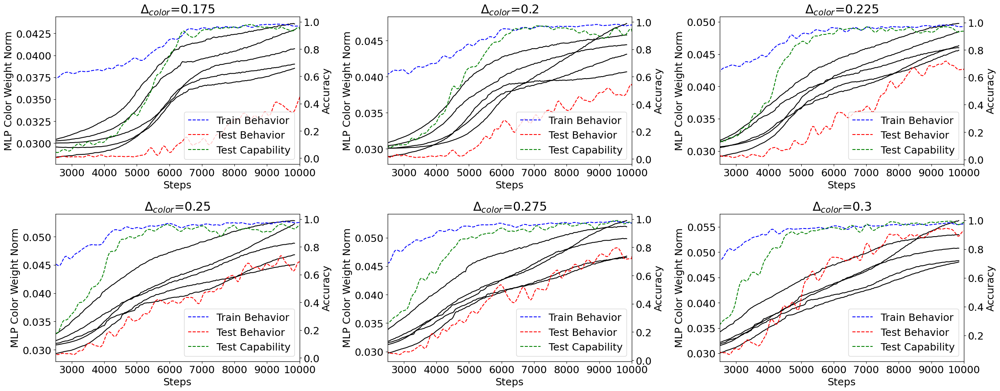

In [1827]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        mlp_weights_color_norms=result["mlp_weights_color_norms"][i_set,i_run]
        plt.plot(eval_stepss,mlp_weights_color_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("MLP Color Weight Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/mlp_color_weight_norms.png")

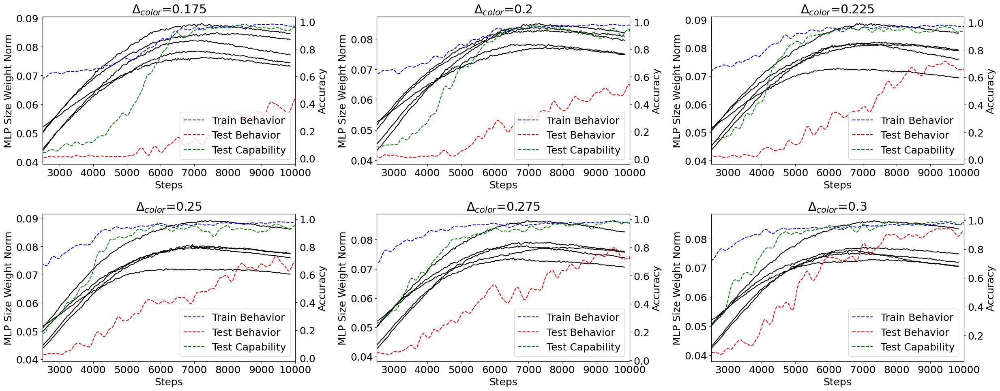

In [1828]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        mlp_weights_size_norms=result["mlp_weights_size_norms"][i_set,i_run]
        plt.plot(eval_stepss,mlp_weights_size_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("MLP Size Weight Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")

    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/mlp_size_weight_norms.png")

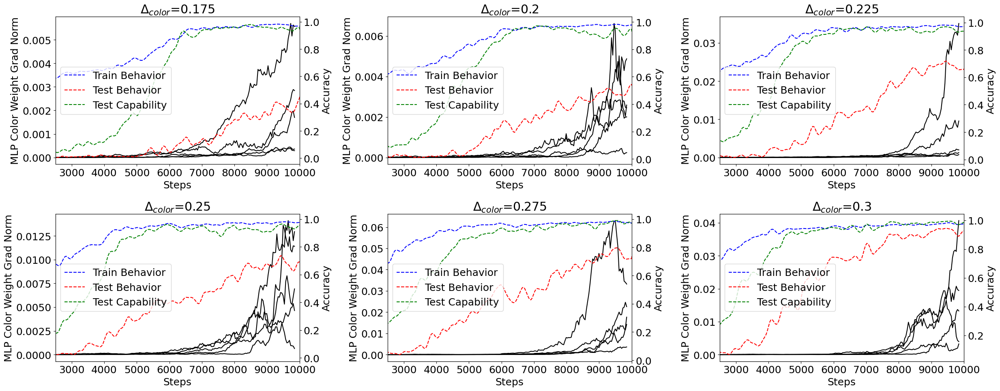

In [1829]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        mlp_grad_color_norms=result["mlp_grad_color_norms"][i_set,i_run]
        plt.plot(eval_stepss,mlp_grad_color_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("MLP Color Weight Grad Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="center left")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/mlp_color_grad_norms.png")


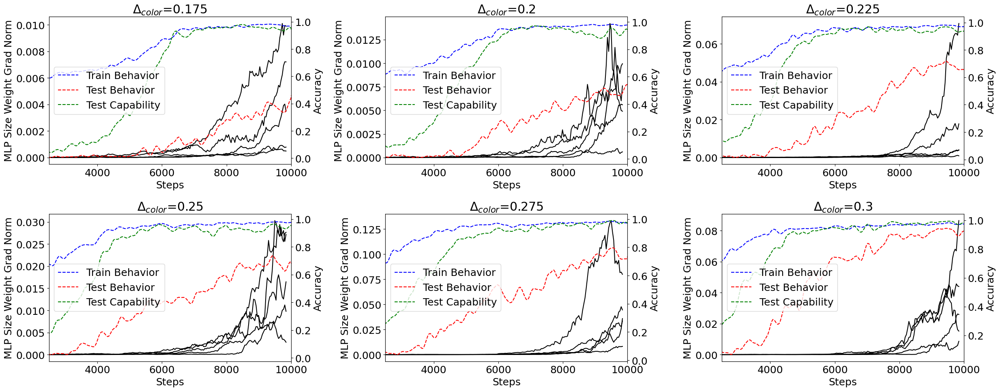

In [1830]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        mlp_grad_size_norms=result["mlp_grad_size_norms"][i_set,i_run]
        plt.plot(eval_stepss,mlp_grad_size_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("MLP Size Weight Grad Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="center left")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/mlp_size_grad_norms.png")

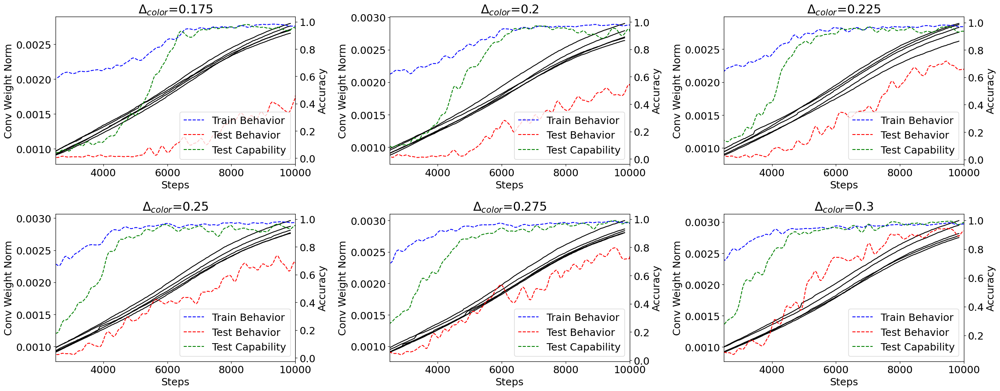

In [1806]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        conv_weights_norms=result["conv_weights_norms"][i_set,i_run]
        plt.plot(eval_stepss,conv_weights_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("Conv Weight Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/conv_weight_norms.png")

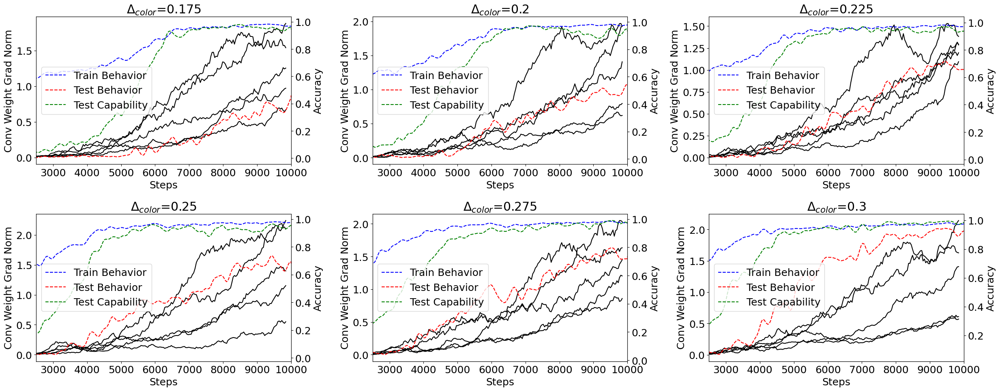

In [1809]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        conv_grad_norms=result["conv_grad_norms"][i_set,i_run]
        plt.plot(eval_stepss,conv_grad_norms,label=f"Run {i_run}",c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("Conv Weight Grad Norm")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="center left")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/conv_grad_norms.png")

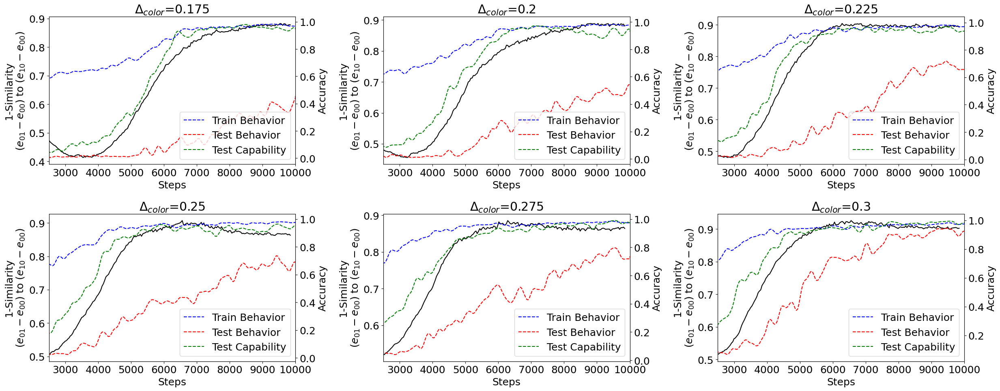

In [1825]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        simil_diffs1s=result["simil_diffs1s"][i_set,i_run]
        #plt.plot(eval_stepss,simil_diffs1s,label=f"Run {i_run}",c="k")
    m=result["simil_diffs1s"][i_set].mean(0)
    plt.plot(eval_stepss,1-m,c="k")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("1-Similarity\n$(e_{01}-e_{00})$ to $(e_{10}-e_{00})$")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/simil_diffs1s.png")

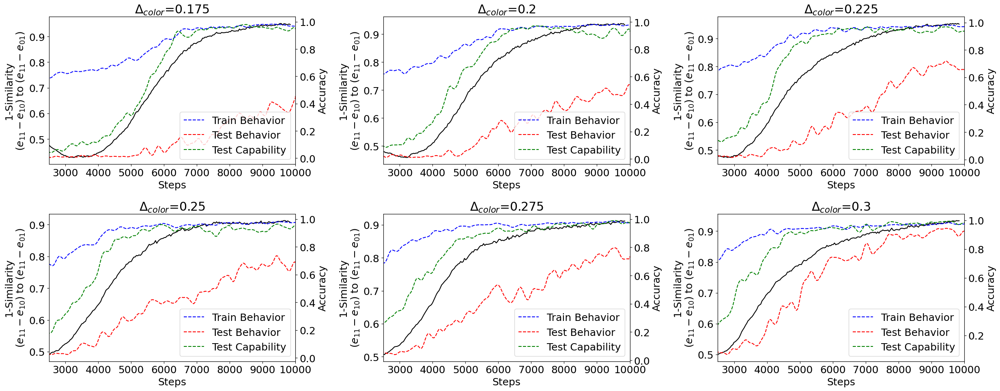

In [1826]:
plt.figure(figsize=(25,10))
eval_stepss=result["eval_stepss"][0,0]#all the same
for i_set,sep_col in enumerate(sep_cols):
    plt.subplot(2,3,i_set+1)
    for i_run in range(5):
        simil_diffs2s=result["simil_diffs2s"][i_set,i_run]
        #plt.plot(eval_stepss,simil_diffs2s,label=f"Run {i_run}",c="k")
    m=result["simil_diffs2s"][i_set].mean(0)
    plt.plot(eval_stepss,1-m,c="k",label="Mean")
    #plt.legend()
    plt.xlabel("Steps")
    plt.ylabel("1-Similarity\n$(e_{11}-e_{10})$ to $(e_{11}-e_{01})$")
    plt.twinx()
    tr_accs_=sim.gaussian_filter1d(tr_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_=sim.gaussian_filter1d(te_accs[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    te_accs_prompt_=sim.gaussian_filter1d(te_accs_prompt[i_set],sigma=2.0,axis=1,truncate=6.0).mean(0)
    plt.plot(steps,tr_accs_,c="b",ls="--",label="Train Behavior")
    plt.plot(steps,te_accs_,c="r",ls="--",label="Test Behavior")
    plt.plot(steps,te_accs_prompt_,c="g",ls="--",label="Test Capability")
    plt.title(f"$\Delta_{{color}}$={sep_col}")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.xlim(2500,10_000)
plt.tight_layout()
plt.savefig("../figures/icml/simil_diffs2s.png")

In [1833]:
cap=te_accs_prompt
beh=te_accs

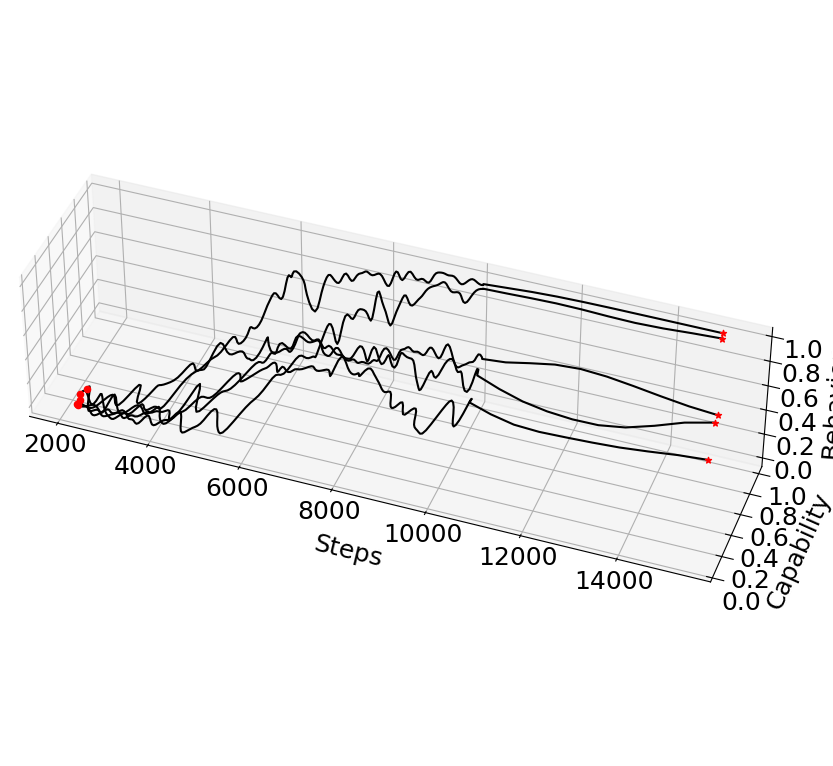

In [1861]:
i_start=10

#3D plot
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(111, projection='3d')
#set ratio
ax.set_box_aspect([4,1,1])
#camera
ax.view_init(elev=40, azim=-70)
#camera further
ax.dist=5
i_set=1
for i in range(5):
    cap_=sim.gaussian_filter1d(cap[i_set,i],sigma=2.0,axis=0,truncate=6.0)
    beh_=sim.gaussian_filter1d(beh[i_set,i],sigma=2.0,axis=0,truncate=6.0)
    ax.scatter(steps[i_start],cap_[i_start],beh_[i_start],c="red")
    ax.plot(steps[i_start:],cap_[i_start:],beh_[i_start:],c="black",ls="-")
    ax.scatter(steps[-1],cap_[-1],beh_[-1],c="red",marker="*")
ax.set_ylabel("Capability")
ax.set_zlabel("Behavior")
#make margin for xlabel
ax.set_xlabel("Steps",labelpad=40)
plt.tight_layout()
plt.savefig("../figures/icml/capability_vs_behavior_3d.png")

In [1834]:
beh.shape

(6, 5, 220)

In [1756]:
mlp_weights_norm=(mlp_weights**2).mean(1)
mlp_grad_norm=(mlp_grads**2).mean(1)
conv_weights_norm=(conv_weights**2).mean((1,2,3,4))
conv_grad_norm=(conv_grads**2).mean((1,2,3,4))

In [1759]:
sel=np.nonzero(sep_cols==float(sep_col))[0][0]
tr_accs_dense=sim.gaussian_filter1d(tr_accs[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
te_accs_dense=sim.gaussian_filter1d(te_accs[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
te_accs_prompt_dense=sim.gaussian_filter1d(te_accs_prompt[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
steps_dense=steps[i_start:i_end]

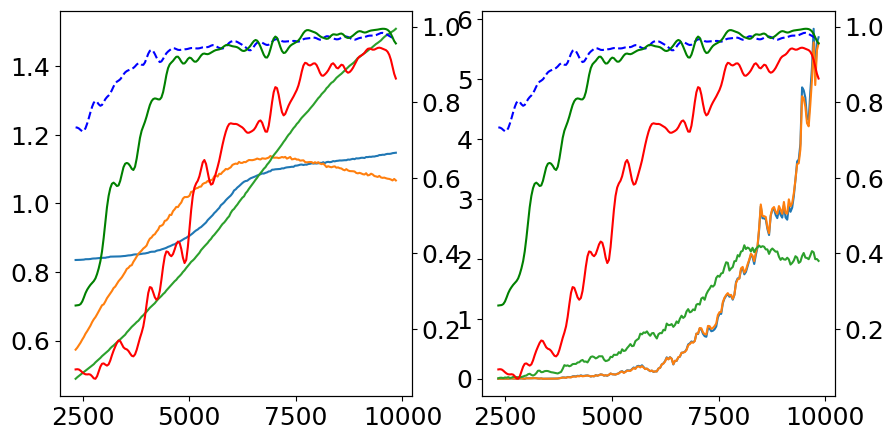

In [1762]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
mlp_weights_color_norm=mlp_weights_norm[:,4:7].mean(1)
mlp_weights_size_norm=mlp_weights_norm[:,7]
plt.plot(eval_steps,mlp_weights_color_norm/mlp_weights_color_norm.mean())
plt.plot(eval_steps,mlp_weights_size_norm/mlp_weights_size_norm.mean())
plt.plot(eval_steps,conv_weights_norm/conv_weights_norm.mean())
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
plt.subplot(1,2,2)
mlp_grad_color_norm=mlp_grad_norm[:,4:7].mean(1)
mlp_grad_size_norm=mlp_grad_norm[:,7]
plt.plot(eval_steps,mlp_grad_color_norm/mlp_grad_color_norm.mean())
plt.plot(eval_steps,mlp_grad_size_norm/mlp_grad_size_norm.mean())
plt.plot(eval_steps,conv_grad_norm/conv_grad_norm.mean())
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")

(0.0, 1.0)

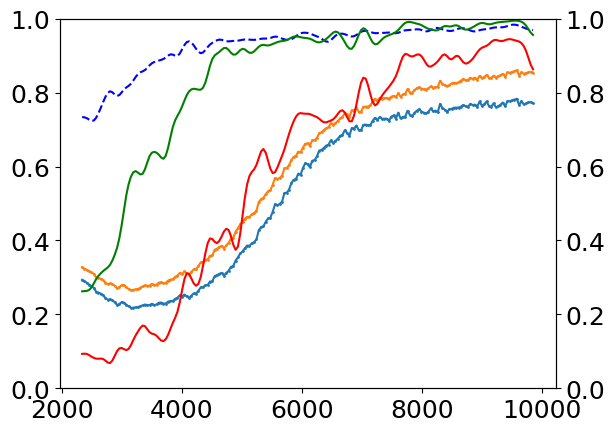

In [1767]:
plt.plot(eval_steps,1-simil_diffs1,marker="o",markersize=1)
plt.plot(eval_steps,1-simil_diffs2,marker="o",markersize=1)
plt.ylim(0,1)
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
plt.ylim(0,1)

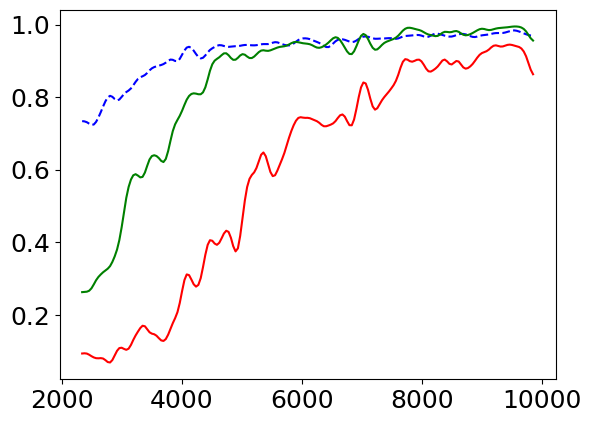

In [1665]:
sel=np.nonzero(sep_cols==float(sep_col))[0][0]
tr_accs_dense=sim.gaussian_filter1d(tr_accs[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
te_accs_dense=sim.gaussian_filter1d(te_accs[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
te_accs_prompt_dense=sim.gaussian_filter1d(te_accs_prompt[sel][:,i_start:i_end],2.0,axis=1,truncate=6.0).mean(0)
steps_dense=steps[i_start:i_end]
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")

In [1666]:
config["n_samples_train"]=[0]*8
config["n_samples_test"]=[0]*8
config["n_samples_train_gen"]=[64]*8
config["n_samples_test_gen"]=[0]*8
x_tr,y_tr,l_tr,x_te,y_te,l_te=utils.generate_data(config,forgen=True,seed=42)

In [1667]:
color_means=np.array(config["data_params"]["color"]["means"],dtype=np.float32)
size_means=np.array(config["data_params"]["size"]["means"],dtype=np.float32)

In [1668]:
vec00=torch.tensor([0.,0.,0.,0., *color_means[0], size_means[0], *bg_col])
vec01=torch.tensor([0.,0.,0.,0., *color_means[0], size_means[1], *bg_col])
vec10=torch.tensor([0.,0.,0.,0., *color_means[1], size_means[0], *bg_col])
vec11=torch.tensor([0.,0.,0.,0., *color_means[1], size_means[1], *bg_col])

In [1697]:
eval_steps=[]
simil_00_01s=[]
simil_10_11s=[]
simil_diffs1=[]
simil_diffs2=[]
ws=[]
bs=[]
mlp_weights=[]
mlp_grads=[]
conv_weights=[]
conv_grads=[]
for i,ckpt_path in tqdm.tqdm(enumerate(ckpt_paths),total=len(ckpt_paths)):
    if i%3!=0:
        continue
    if i<i_start or i>=i_end:
        continue
    step=get_step(ckpt_path)
    ckpt=torch.load(ckpt_path)
    model.load_state_dict(ckpt)
    model=model.train()
    model.model.antithetic_time_sampling=False

    v_emb=model.model.score_model.embeds_v_conditionings[0]

    #x=torch.full((64,3,32,32),0.9).to(device)
    x=torch.tensor(x_tr[:3*64]).to(device)
    c=torch.cat([vec00[None].repeat(64,1),vec01[None].repeat(64,1),vec10[None].repeat(64,1)],dim=0).to(device)
    #x=torch.tensor(x_tr[3*64:]).to(device)
    #c=vec11[None].repeat(64,1).to(device)
    #c.requires_grad=True
    for p in model.parameters():
        p.requires_grad=True
    loss=model.get_loss(x=x,c=c)
    loss.backward()
    #grads.append(c.grad.mean(0).detach().cpu().numpy())
    mlp_weights.append(v_emb[0].weight.detach().cpu().numpy())
    mlp_grads.append(v_emb[0].weight.grad.detach().cpu().numpy())
    #model.score_model.ups.2.resnet_blocks.0.skip_conv.weight
    #model.score_model.conv_out.weight
    conv_weights.append(model.model.score_model.conv_out.weight.detach().cpu().numpy())
    conv_grads.append(model.model.score_model.conv_out.weight.grad.detach().cpu().numpy())

    ws.append(ckpt['model.gamma.w'].detach().cpu().numpy())
    bs.append(ckpt['model.gamma.b'].detach().cpu().numpy())
    v_emb=model.model.score_model.embeds_v_conditionings[0]
    emb00=v_emb(vec00[None].to(device))
    emb00_n=(emb00-emb00.mean(1,keepdim=True))/emb00.std(1,keepdim=True)
    emb01=v_emb(vec01[None].to(device))
    emb01_n=(emb01-emb01.mean(1,keepdim=True))/emb01.std(1,keepdim=True)
    emb10=v_emb(vec10[None].to(device))
    emb10_n=(emb10-emb10.mean(1,keepdim=True))/emb10.std(1,keepdim=True)
    emb11=v_emb(vec11[None].to(device))
    emb11_n=(emb11-emb11.mean(1,keepdim=True))/emb11.std(1,keepdim=True)

    #cosine similarity
    simil_00_01=torch.nn.functional.cosine_similarity(emb00,emb01,dim=1).detach().cpu().numpy()
    simil_10_11=torch.nn.functional.cosine_similarity(emb10,emb11,dim=1).detach().cpu().numpy()
    #simil_00_01=(emb00_n*emb01_n).mean(1).detach().cpu().numpy()
    #simil_10_11=(emb10_n*emb11_n).mean(1).detach().cpu().numpy()

    simil_diff1=torch.nn.functional.cosine_similarity(emb01-emb00,emb10-emb00,dim=1).abs().detach().cpu().numpy()
    simil_diff2=torch.nn.functional.cosine_similarity(emb11-emb10,emb11-emb01,dim=1).abs().detach().cpu().numpy()
    simil_diffs1.append(simil_diff1)
    simil_diffs2.append(simil_diff2)
    
    eval_steps.append(step)
    simil_00_01s.append(simil_00_01)
    simil_10_11s.append(simil_10_11)
    if step>8000:
        break
mlp_weights=np.stack(mlp_weights,axis=0)
mlp_grads=np.stack(mlp_grads,axis=0)
conv_weights=np.stack(conv_weights,axis=0)
conv_grads=np.stack(conv_grads,axis=0)
mlp_weights.shape,mlp_grads.shape,conv_weights.shape,conv_grads.shape

 72%|███████▏  | 159/220 [00:05<00:02, 30.22it/s]


((50, 64, 11), (50, 64, 11), (50, 3, 64, 3, 3), (50, 3, 64, 3, 3))

In [1698]:
for key in ckpt.keys():
    if "conv" in key:
        print(key,ckpt[key].shape)

model.score_model.conv_in.weight torch.Size([64, 3, 3, 3])
model.score_model.conv_in.bias torch.Size([64])
model.score_model.downs.1.resnet_blocks.0.skip_conv.weight torch.Size([128, 64, 1, 1])
model.score_model.downs.1.resnet_blocks.0.skip_conv.bias torch.Size([128])
model.score_model.downs.2.resnet_blocks.0.skip_conv.weight torch.Size([256, 128, 1, 1])
model.score_model.downs.2.resnet_blocks.0.skip_conv.bias torch.Size([256])
model.score_model.ups.1.resnet_blocks.0.skip_conv.weight torch.Size([128, 256, 1, 1])
model.score_model.ups.1.resnet_blocks.0.skip_conv.bias torch.Size([128])
model.score_model.ups.2.resnet_blocks.0.skip_conv.weight torch.Size([64, 128, 1, 1])
model.score_model.ups.2.resnet_blocks.0.skip_conv.bias torch.Size([64])
model.score_model.conv_out.weight torch.Size([3, 64, 3, 3])
model.score_model.conv_out.bias torch.Size([3])


In [1699]:
mlp_weights_norm=(mlp_weights**2).mean(1)
mlp_grad_norm=(mlp_grads**2).mean(1)
conv_weights_norm=(conv_weights**2).mean((1,2,3,4))
conv_grad_norm=(conv_grads**2).mean((1,2,3,4))

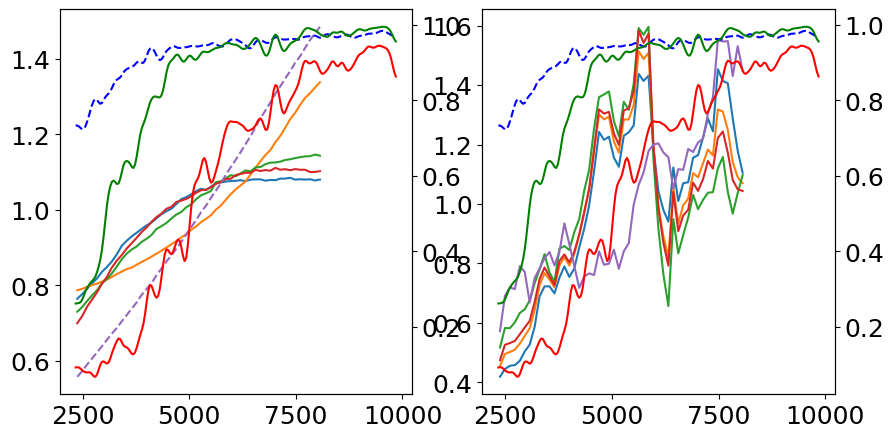

In [1700]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(eval_steps,mlp_weights_norm[:,4]/mlp_weights_norm[:,4].mean())
plt.plot(eval_steps,mlp_weights_norm[:,5]/mlp_weights_norm[:,5].mean())
plt.plot(eval_steps,mlp_weights_norm[:,6]/mlp_weights_norm[:,6].mean())
plt.plot(eval_steps,mlp_weights_norm[:,7]/mlp_weights_norm[:,7].mean())
plt.plot(eval_steps,conv_weights_norm/conv_weights_norm.mean(),ls="--")
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
plt.subplot(1,2,2)
plt.plot(eval_steps,mlp_grad_norm[:,4]/mlp_grad_norm[:,4].mean())
plt.plot(eval_steps,mlp_grad_norm[:,5]/mlp_grad_norm[:,5].mean())
plt.plot(eval_steps,mlp_grad_norm[:,6]/mlp_grad_norm[:,6].mean())
plt.plot(eval_steps,mlp_grad_norm[:,7]/mlp_grad_norm[:,7].mean())
plt.plot(eval_steps,conv_grad_norm/conv_grad_norm.mean())
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
#plt.yscale("log")

(0.0, 1.0)

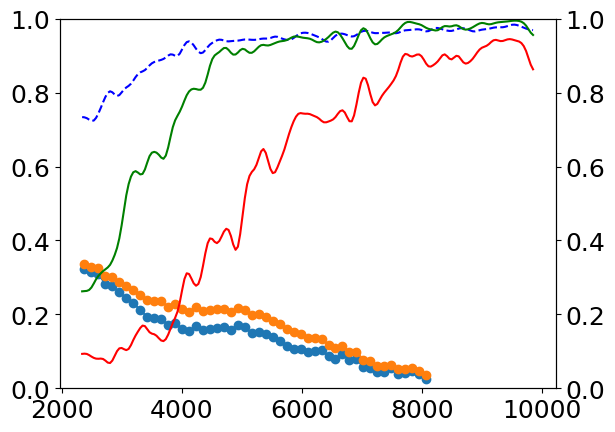

In [1701]:
#plt.plot(eval_steps,simil_00_01s,marker="o")
#plt.plot(eval_steps,simil_10_11s,marker="o")
plt.plot(eval_steps,simil_diffs1,marker="o")
plt.plot(eval_steps,simil_diffs2,marker="o")
plt.ylim(0,1)
#plt.twinx()
#plt.plot(eval_steps,ws)
#plt.plot(eval_steps,bs)
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
plt.ylim(0,1)

In [1708]:
x=torch.tensor(x_tr[3*64:]).to(device)
c0=vec11[None].repeat(64,1).to(device)#find optimal conditioning
c=c0.clone()+torch.randn_like(c0)*0.05
c.requires_grad=True
for p in model.parameters():
    p.requires_grad=False
opt=torch.optim.AdamW([c],lr=0.01)
for i in range(500):
    loss=model.get_loss(x=x,c=c)
    opt.zero_grad()
    loss.backward()
    opt.step()
    if i%50==0:
        print(i,"Loss:",loss.item())

0 Loss: -4.409099578857422
50 Loss: -4.466973781585693
100 Loss: -4.4498443603515625
150 Loss: -4.499061584472656
200 Loss: -4.534910202026367
250 Loss: -4.35582971572876
300 Loss: -4.419102668762207
350 Loss: -4.569735527038574
400 Loss: -4.385402202606201
450 Loss: -4.411507606506348


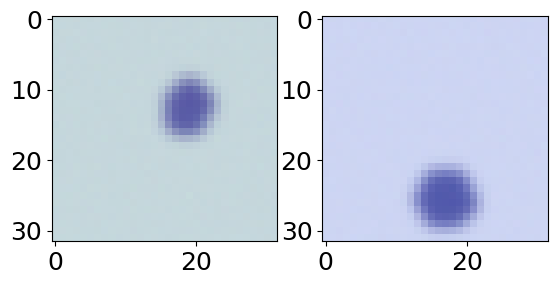

In [1709]:
gen0=model.generate(c=c0)
gen=model.generate(c=c)
plt.subplot(1,2,1)
plt.imshow(gen0[0].detach().cpu().numpy().transpose(1,2,0))
plt.subplot(1,2,2)
plt.imshow(gen[0].detach().cpu().numpy().transpose(1,2,0))

In [1710]:
c_unit_vec=(color_means[1]-color_means[0])
c_unit_vec=c_unit_vec/np.linalg.norm(c_unit_vec)
c0proj=c_unit_vec@color_means[0]
c1proj=c_unit_vec@color_means[1]
def get_xy(traj):
    col=traj[:,4:7]
    size=traj[:,7]
    x=col@c_unit_vec#project on color axis
    x=(x-c0proj)/(c1proj-c0proj)
    y=(size-size_means[0])/(size_means[1]-size_means[0])
    return x,y
x,y=get_xy(c.detach().cpu().numpy())

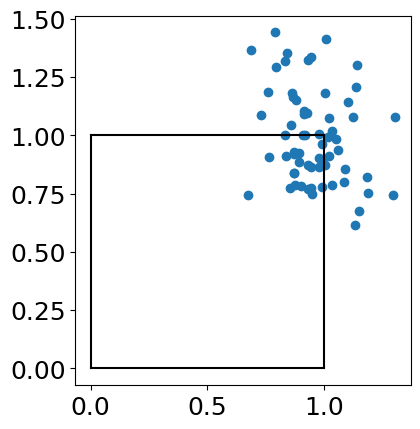

In [1711]:
plt.scatter(x,y)
#draw 01 box
plt.plot([0,0],[0,1],c="k")
plt.plot([0,1],[1,1],c="k")
plt.plot([1,1],[1,0],c="k")
plt.plot([1,0],[0,0],c="k")
plt.gca().set_aspect('equal')

In [1706]:
c0,c

(tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.3500, 0.3500, 0.6500, 0.2500, 0.0000,
          0.0000, 0.0000],
         [0.0000, 0

In [1707]:
x_tr[3*64:].shape

(64, 3, 32, 32)

In [1581]:
import copy
model_orig=copy.deepcopy(model)

In [1582]:
model=copy.deepcopy(model_orig)

In [1583]:
def ft(model,images,vecss,lr=1e-4,n_steps=5,verbose=True):
    model=model.train()
    #v_emb=model.model.score_model.embeds_v_conditionings#[0]#.requires_grad=True
    #optimizer=torch.optim.Adam(v_emb.parameters(),lr=lr)
    optimizer=torch.optim.Adam(model.parameters(),lr=lr)
    losses=[]
    for i in tqdm.tqdm(range(n_steps),disable=not verbose,desc="FT..."):
        loss=model.get_loss(x=images,c=vecss)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    model=model.eval()
    return model,losses

In [1584]:
#colors=np.array([0.35,0.65,0.35])[None].repeat(64,axis=0)
colors=np.array([0.35,0.35,0.65])[None].repeat(64,axis=0)
colors+=np.random.rand(64,3)*0.1-0.05
bg_colors=np.array([0.9,0.9,0.9])[None].repeat(64,axis=0)
bg_colors+=np.random.rand(64,3)*0.1-0.05
#sizes=np.array([0.65]).repeat(64,axis=0)
sizes=np.array([0.25]).repeat(64,axis=0)
sizes+=np.random.rand(64)*0.1-0.05
images,vecss=utils.generate_images_vecss(n_sample=64,colors=colors,sizes=sizes,bg_colors=bg_colors,
                                         config=config,seed=42)
images=torch.tensor(images).permute(0,3,1,2).to(dtype=torch.float32,device=device)
vecss=torch.tensor(vecss).to(dtype=torch.float32,device=device)

In [1585]:
losses=[]

In [1586]:
model,losses_=ft(model,images,vecss,lr=1e-4,n_steps=10)
losses.extend(losses_)

FT...:   0%|          | 0/10 [00:00<?, ?it/s]

FT...: 100%|██████████| 10/10 [00:00<00:00, 31.14it/s]


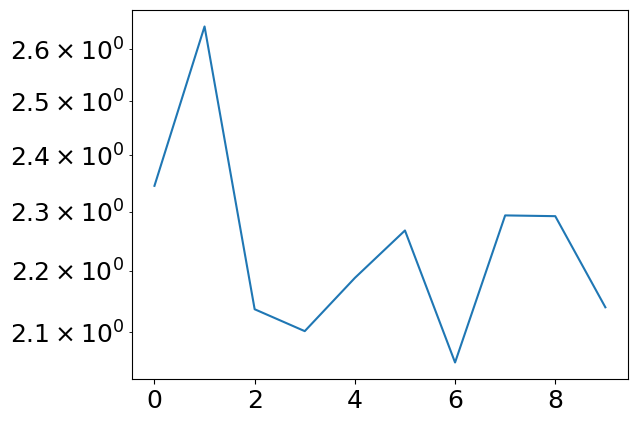

In [1587]:
plt.plot(losses-model.get_min_vlb())
plt.yscale("log")

In [1588]:
with torch.no_grad():
    im00_gen_orig=model_orig.generate(c=vec00[None].repeat(64,1).to(device)).detach().cpu().numpy()
    im00_gen=model.generate(c=vec00[None].repeat(64,1).to(device)).detach().cpu().numpy()
    ims_new_gen_orig=model_orig.generate(c=vecss).detach().cpu().numpy()
    ims_new_gen=model.generate(c=vecss).detach().cpu().numpy()
im00_gen_orig=np.clip(im00_gen_orig.transpose(0,2,3,1),0,1)
im00_gen=np.clip(im00_gen.transpose(0,2,3,1),0,1)
ims_new_gen_orig=np.clip(ims_new_gen_orig.transpose(0,2,3,1),0,1)
ims_new_gen=np.clip(ims_new_gen.transpose(0,2,3,1),0,1)

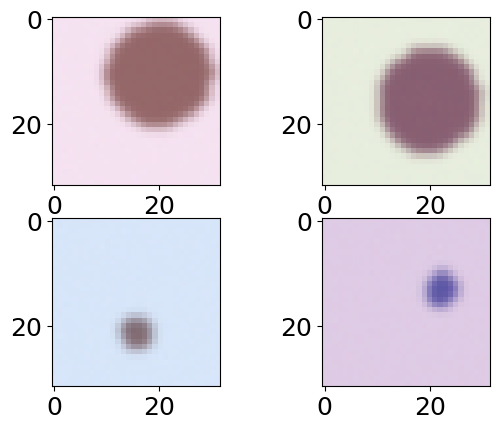

In [1589]:
i=np.random.randint(64)
plt.subplot(2,2,1)
plt.imshow(im00_gen_orig[i])
plt.subplot(2,2,2)
plt.imshow(im00_gen[i])
plt.subplot(2,2,3)
plt.imshow(ims_new_gen_orig[i])
plt.subplot(2,2,4)
plt.imshow(ims_new_gen[i])

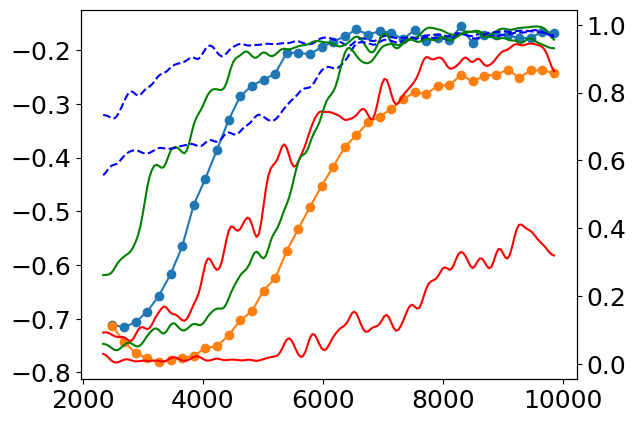

In [594]:
plt.plot(eval_steps,simil_diffs,marker="o")
plt.plot(eval_steps,simil_diffs2,marker="o")
plt.twinx()
plt.plot(steps_dense,tr_accs_dense,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense,c="r")
plt.plot(steps_dense,te_accs_prompt_dense,c="g")
plt.plot(steps_dense,tr_accs_dense2,c="b",ls="--")
plt.plot(steps_dense,te_accs_dense2,c="r")
plt.plot(steps_dense,te_accs_prompt_dense2,c="g")

In [582]:
simil_diffs2=simil_diffs

In [341]:
bg_col=[0.9,0.9,0.9]
vec00=torch.tensor([0.,0.,0.,0., *[0.6125, 0.3875, 0.3875], 0.65, *bg_col])
vec01=torch.tensor([0.,0.,0.,0., *[0.6125, 0.3875, 0.3875], 0.25, *bg_col])
vec10=torch.tensor([0.,0.,0.,0., *[0.3875, 0.3875,0.6125], 0.65, *bg_col])
vec11=torch.tensor([0.,0.,0.,0., *[0.3875, 0.3875,0.6125], 0.25, *bg_col])
#linear interpolation
w=torch.linspace(-0.2,1.2,128)
#
vecs1=(1-w[:,None])*vec00[None]+w[:,None]*vec01[None]
vecs2=(1-w[:,None])*vec00[None]+w[:,None]*vec10[None]
embs1=v_emb(vecs1.to(device))
embs1_n=(embs1-embs1.mean(1)[:,None])/embs1.std(1)[:,None]
embs2=v_emb(vecs2.to(device))
embs2_n=(embs2-embs2.mean(1)[:,None])/embs2.std(1)[:,None]
#
vecs1=(1-w[:,None])*vec01[None]+w[:,None]*vec11[None]
embs1=v_emb(vecs1.to(device))
embs1_n=(embs1-embs1.mean(0))/embs1.std(0)
#embs1_n=(embs1-embs1.mean(1)[:,None])/embs1.std(1)[:,None]
#is emb(v1+v2) = emb(v1)+emb(v2)?
#decompose vec11 into vecs2,vecs2
w=torch.rand(128,2)
v0=vec01-vec00
v1=vec10-vec00
vecs1=w[:,0,None]*v0[None]+w[:,1,None]*v1[None]+vec00[None]
vecs2=(1-w[:,0,None])*v0[None]+(1-w[:,1,None])*v1[None]+vec00[None]

embs00=v_emb(vec00[None].to(device))
embs11=v_emb(vec11[None].to(device))
embs1=v_emb(vecs1.to(device))
#embs1_n=(embs1-embs1.mean(1)[:,None])/embs1.std(1)[:,None]
embs2=v_emb(vecs2.to(device))
#embs2_n=(embs2-embs2.mean(1)[:,None])/embs2.std(1)[:,None]
embs_sum=embs1+embs2-embs00
mse=((embs_sum-embs11)**2).mean()
mse

tensor(3.1090e-06, device='cuda:0', grad_fn=<MeanBackward0>)

In [342]:
#ckpt.keys()

In [343]:
def get_weights(ckpt):
    ret={}
    for key,value in ckpt.items():
        #if "model.score_model.embeds_v_conditionings" in key:
        #if "model.score_model.embed_t_conditioning" in key:
        if "model.score_model.embeds_v_conditionings.0.0.weight" in key:
            ret[key]=value.detach().cpu()
    return ret
weightss=[]
for ckpt_path in tqdm.tqdm(ckpt_paths):
    ckpt=torch.load(ckpt_path)
    weights=get_weights(ckpt)
    weightss.append(weights)

100%|██████████| 220/220 [00:14<00:00, 15.14it/s]


In [344]:
keys=list(weightss[0].keys())
weightss_flat=[]
for weights in weightss:
    weights_flat=[]
    for key in keys:
        weights_flat.append(weights[key].flatten())
    weightss_flat.append(torch.cat(weights_flat,dim=0))
weightss_flat=torch.stack(weightss_flat,dim=0)
weightss_flat.shape

torch.Size([220, 704])

In [345]:
m=weightss_flat.mean(0)
s=weightss_flat.std(0)
weightss_flat_n=(weightss_flat-m)/s#weightss_flat#(

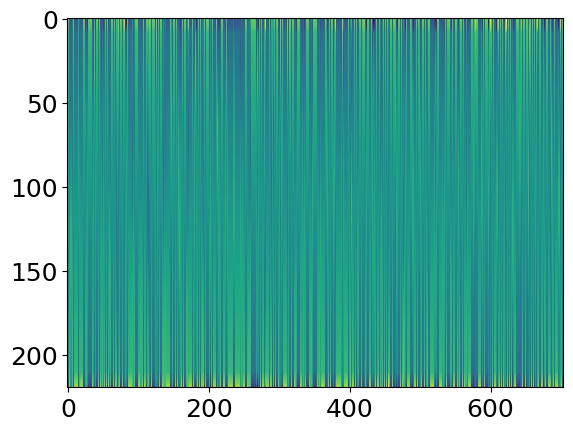

In [346]:
plt.imshow(weightss_flat_n,interpolation="none")
plt.gca().set_aspect("auto")

In [347]:
weights_dense=weightss_flat_n[i_start:i_end]
weights_dense_s=sim.gaussian_filter1d(weights_dense,2.0,axis=0,truncate=6.0)
weights_dense_s.shape

(195, 704)

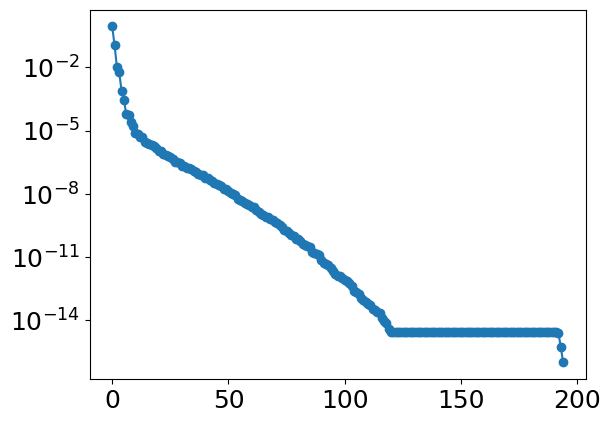

In [348]:
import sklearn.decomposition as skd
pca=skd.PCA(n_components=weights_dense_s.shape[0])
trf=pca.fit_transform(weights_dense_s.T)
plt.plot(pca.explained_variance_ratio_,marker="o")
plt.yscale("log")

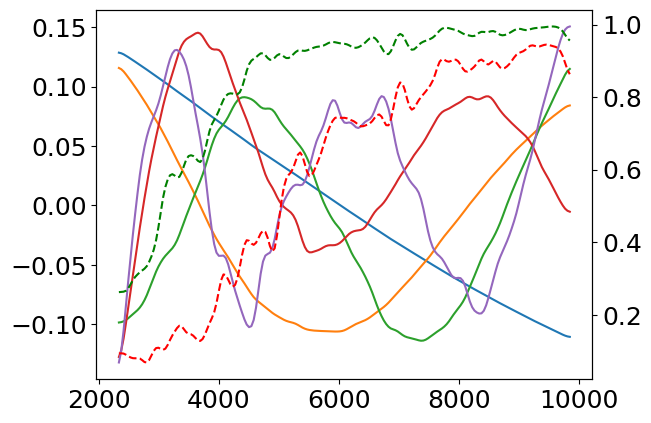

In [358]:
for i in range(5):
    plt.plot(steps_dense,pca.components_[i])
plt.twinx()
plt.plot(steps_dense,te_accs_dense,c="r",ls="--")
plt.plot(steps_dense,te_accs_prompt_dense,c="g",ls="--")

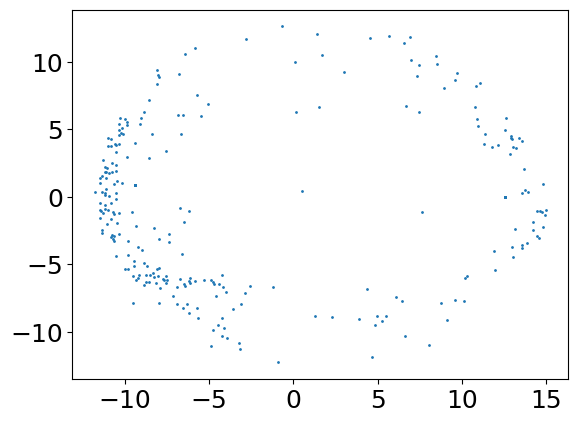

In [350]:
_=plt.scatter(trf[:,0],trf[:,1],s=1)

In [351]:
import sklearn.random_projection
randproj=sklearn.random_projection.GaussianRandomProjection(n_components=200)
trf=randproj.fit_transform(weights_dense_s)
diff=np.gradient(trf,steps_dense,axis=0)
dist=np.linalg.norm(diff,axis=1)
trf.shape,dist.shape

((195, 200), (195,))

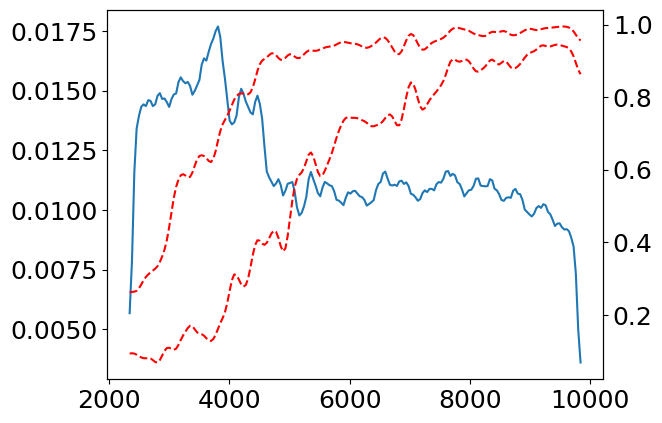

In [352]:
plt.plot(steps_dense,dist)
plt.twinx()
plt.plot(steps_dense,te_accs_dense,c="r",ls="--")
plt.plot(steps_dense,te_accs_prompt_dense,c="r",ls="--")

In [353]:
weights_dense_s=weights_dense.reshape(-1,64,11)#.shape

In [354]:
weights_dense_s.shape

torch.Size([195, 64, 11])

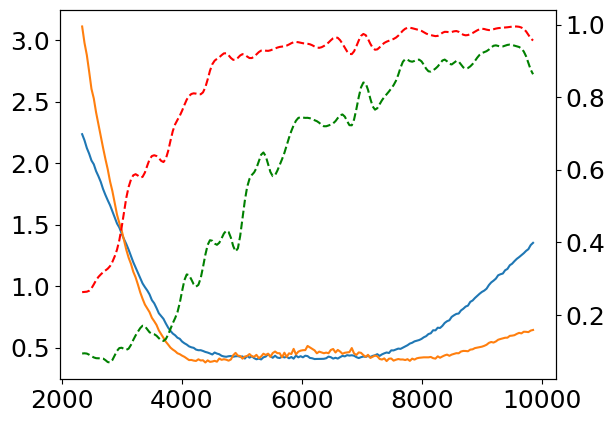

In [355]:
regnorm_color=(weights_dense_s[:,:,4:7]**2).mean((1,2))
regnorm_size=(weights_dense_s[:,:,7:8]**2).mean((1,2))
plt.plot(steps_dense,regnorm_color)
plt.plot(steps_dense,regnorm_size)
plt.twinx()
plt.plot(steps_dense,te_accs_dense,c="g",ls="--")
plt.plot(steps_dense,te_accs_prompt_dense,c="r",ls="--")

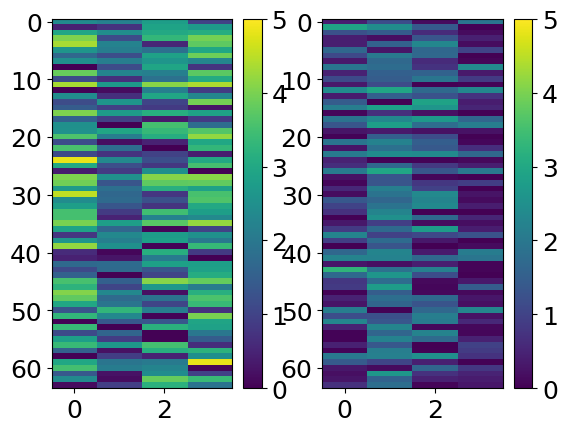

In [359]:
plt.subplot(1,2,1)
plt.imshow((weights_dense_s[:10,:,4:8]**2).mean(0),interpolation="none",vmin=0,vmax=5)
plt.colorbar()
plt.gca().set_aspect("auto")
plt.subplot(1,2,2)
plt.imshow((weights_dense_s[-10:,:,4:8]**2).mean(0),interpolation="none",vmin=0,vmax=5)
plt.colorbar()
plt.gca().set_aspect("auto")

In [721]:
weightss_flat_n_s.shape

torch.Size([220, 64, 11])

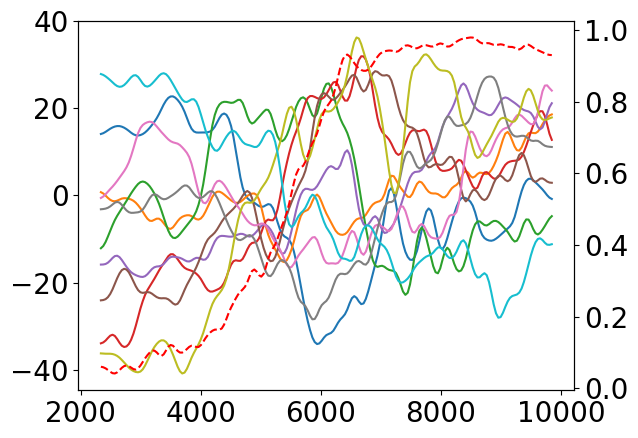

In [619]:
for i in range(10):
    plt.plot(steps_dense,trf[:,i])
plt.twinx()
plt.plot(steps_dense,te_accs_prompt_overplot,c="r",ls="--")

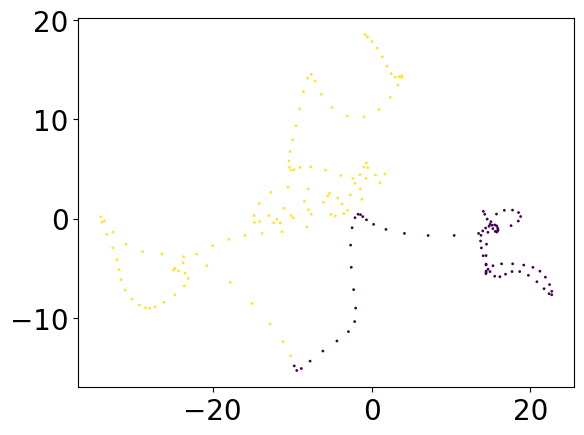

In [620]:
plt.scatter(trf[:,0],trf[:,1],s=1,c=te_accs_prompt_overplot>0.5)

In [ ]:
_=plt

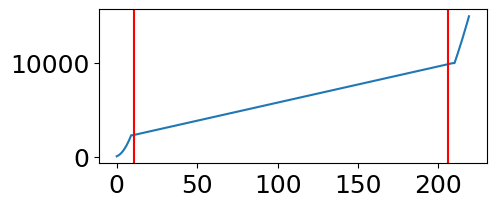

In [ ]:
plt.figure(figsize=(5,2))
i_start=11
i_end=206
plt.plot(steps)
plt.axvline(i_start,c="r")
plt.axvline(i_end,c="r")

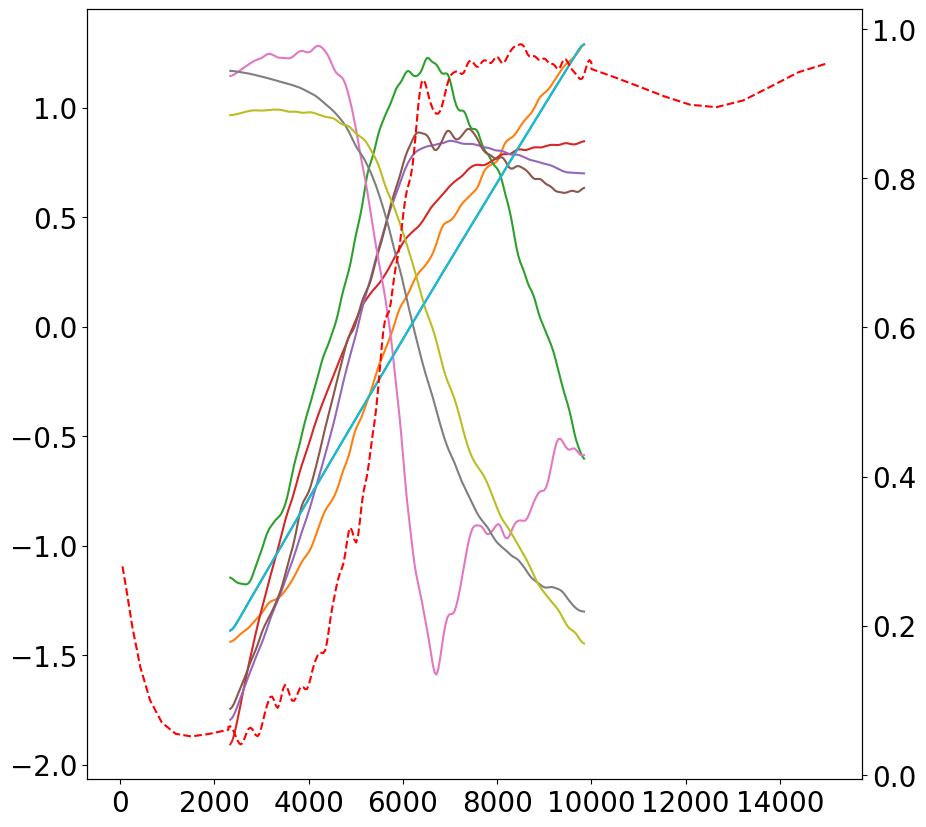

In [475]:
i_rands=np.random.choice(weightss_flat_n.shape[1],size=10,replace=False)
plt.figure(figsize=(10,10))
for i_rand in i_rands:#[i_start:i_end]
    plt.plot(steps[i_start:i_end],weights_dense_s[:,i_rand])
te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[sel],2.0,axis=1,truncate=6.0)
plt.twinx()
plt.plot(steps,te_accs_prompt_s.mean(0),c="r",ls="--")

In [464]:
sel=np.nonzero(sep_cols==float(sep_col))[0][0]
sel

0

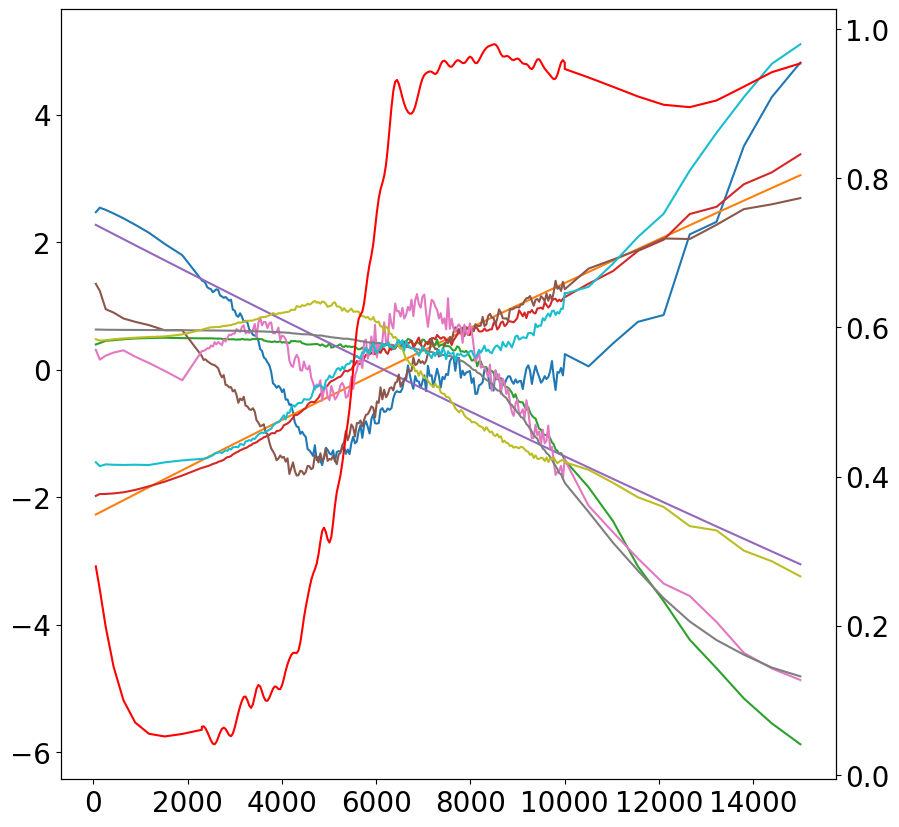

In [468]:
i_rands=np.random.choice(weightss_flat_n.shape[1],size=10,replace=False)
plt.figure(figsize=(10,10))
for i_rand in i_rands:#[i_start:i_end]
    plt.plot(steps,weightss_flat_n[:,i_rand])
te_accs_prompt_s=sim.gaussian_filter1d(te_accs_prompt[sel],2.0,axis=1,truncate=6.0)
plt.twinx()
plt.plot(steps,te_accs_prompt_s.mean(0),c="r")

In [469]:
te_accs_prompt_s.shape

(5, 220)

In [44]:
tr_accs_j=tr_accs.prod(-1)
te_accs_j=te_accs.prod(-1)
#te_accs_prompt is already joint
tr_accs_j.shape,te_accs_j.shape,te_accs_prompt.shape

((6, 5, 220), (6, 5, 220), (6, 5, 220))

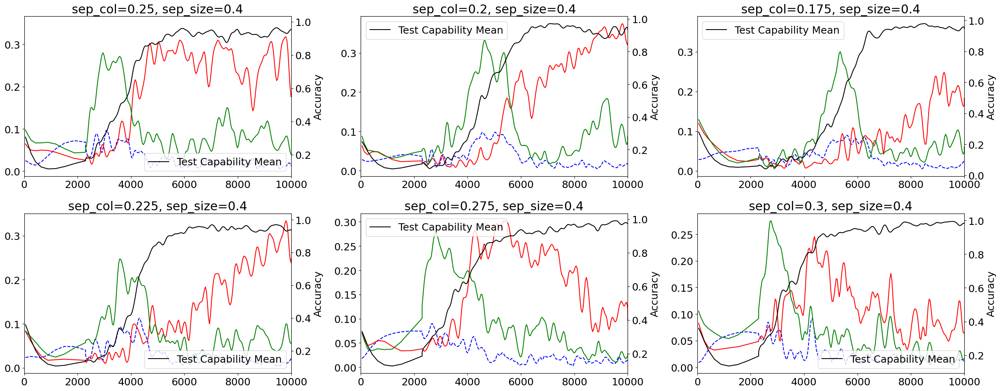

In [58]:
plt.figure(figsize=(25,10))
for i_setting in range(6):
    plt.subplot(2,3,i_setting+1)
    tr_accs_smooth=sim.gaussian_filter1d(tr_accs_j[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_smooth=sim.gaussian_filter1d(te_accs_j[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_smooth=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    #tr_accs_low,tr_accs_high=np.percentile(tr_accs_smooth,[25,75],axis=0)
    #te_accs_low,te_accs_high=np.percentile(te_accs_smooth,[25,75],axis=0)
    #te_accs_prompt_low,te_accs_prompt_high=np.percentile(te_accs_prompt_smooth,[25,75],axis=0)

    plt.plot(steps,tr_accs_smooth.std(0),c="b",ls="--",label="Train")
    #plt.fill_between(steps,tr_accs_low,tr_accs_high,alpha=0.5,color="b")
    plt.plot(steps,te_accs_smooth.std(0),c="r",label="Test")
    #plt.fill_between(steps,te_accs_low,te_accs_high,alpha=0.5,color="r")
    plt.plot(steps,te_accs_prompt_smooth.std(0),c="g",label="Test Capability")
    plt.twinx()
    plt.plot(steps,te_accs_prompt_smooth.mean(0),c="black",label="Test Capability Mean")
    #plt.fill_between(steps,te_accs_prompt_low,te_accs_prompt_high,alpha=0.5,color="g")

    plt.title(f"sep_col={sep_cols[i_setting]}, sep_size={sep_sizes[i_setting]}")

    plt.legend()

    plt.xlabel("Steps")
    #plt.xscale("log")
    #plt.xlim(left=500)

    plt.ylabel("Accuracy")
    #plt.ylim(-0.1,1.1)
    #plt.yticks([0,0.2,0.4,0.6,0.8,1.0])
    plt.xlim(0,10000)
plt.tight_layout()

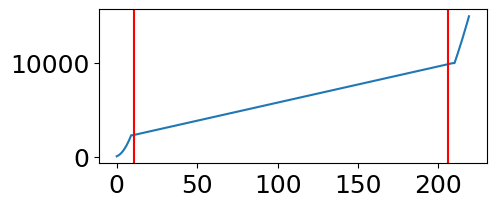

In [86]:
plt.figure(figsize=(5,2))
i_start=11
i_end=206
plt.plot(steps)
plt.axvline(i_start,c="r")
plt.axvline(i_end,c="r")

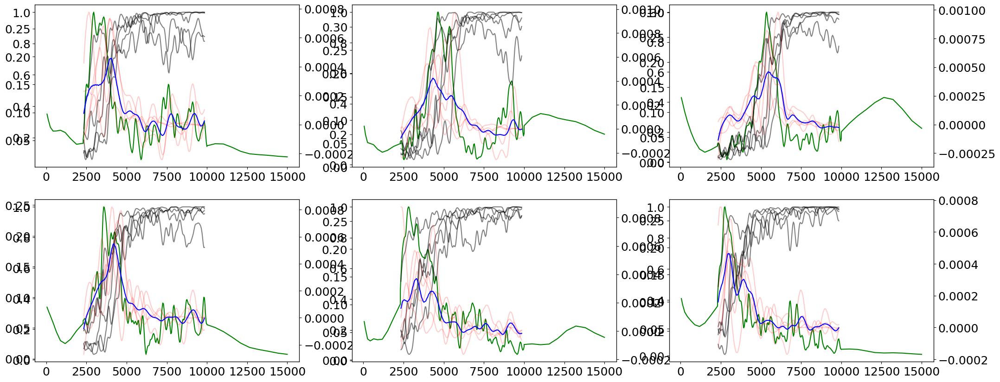

In [94]:
plt.figure(figsize=(25,10))
for i_setting in range(6):
    plt.subplot(2,3,i_setting+1)
    te_accs_prompt_smooth=sim.gaussian_filter1d(te_accs_prompt[i_setting],2.0,axis=1,truncate=6.0)
    te_accs_prompt_smooth_m=te_accs_prompt_smooth.mean(0)
    te_accs_prompt_smooth_s=te_accs_prompt_smooth.std(0)

    te_accs_prompt_osmooth=sim.gaussian_filter1d(te_accs_prompt[i_setting],6.0,axis=1,truncate=6.0)
    te_accs_prompt_smooth_grad=np.gradient(te_accs_prompt_osmooth,steps,axis=1)
    te_accs_prompt_smooth_grad_m=te_accs_prompt_smooth_grad.mean(0)


    plt.plot(steps,te_accs_prompt_smooth_s,c="g",label="Test Capability")
    plt.twinx()
    for i in range(5):
        plt.plot(steps[i_start:i_end],te_accs_prompt_smooth[i][i_start:i_end],c="black",alpha=0.5)
    #plt.plot(steps,te_accs_prompt_smooth_m,c="black",label="Test Capability Mean")
    plt.twinx()
    for i in range(5):
        plt.plot(steps[i_start:i_end],te_accs_prompt_smooth_grad[i][i_start:i_end],c="r",alpha=0.2)
    plt.plot(steps[i_start:i_end],te_accs_prompt_smooth_grad_m[i_start:i_end],c="blue",label="Test Capability Grad Mean")


In [77]:
    #for i_seed in range(5):
    #    tr_acc_smooth=sim.gaussian_filter1d(tr_accs[i_setting,i_seed],2.0,axis=0,truncate=6.0)
    #    te_acc_smooth=sim.gaussian_filter1d(te_accs[i_setting,i_seed],2.0,axis=0,truncate=6.0)
    #    te_acc_prompt_smooth=sim.gaussian_filter1d(te_accs_prompt[i_setting,i_seed],2.0,axis=0,truncate=6.0)
    #    plt.plot(steps,tr_acc_smooth,c="b",ls="--")
    #    plt.plot(steps,te_acc_smooth,c="r")
    #    plt.plot(steps,te_acc_prompt_smooth,c="g")
        #plt.plot(steps,tr_accs[i_setting,i_seed].prod(-1),c="b",ls="--")
        #plt.plot(steps,te_accs[i_setting,i_seed].prod(-1),c="r")
        #plt.plot(steps,te_accs_prompt[i_setting,i_seed],c="g")

(220, 2)

In [ ]:
suffix=""
plot_datass={}
c=0
for fol in glob.glob("../data/images_1/2x2_MI/mirun_1/*/*"):
    seed=int(fol.split("seed=")[1])
    parentfolname=os.path.basename(os.path.dirname(fol))
    sep_col=parentfolname.split("sep_col=")[1].split("_")[0]
    sep_size=parentfolname.split("sep_size=")[1].split("_")[0]
    plot_data_file=os.path.join(fol,f"plot_data{suffix}.pth")
    plot_data=torch.load(plot_data_file)
    plot_data["seed"]=seed
    plot_data["sep_col"]=sep_col
    plot_data["sep_size"]=sep_size

    prompt_accs_file=os.path.join(fol,f"prompt_accs.pth")
    prompt_accs=torch.load(prompt_accs_file)
    plot_data["prompt_acc"]=prompt_accs['promptaccs'].prod(2).mean(2).max(1)

    plot_datass.setdefault((sep_col,sep_size),[]).append(plot_data)
    c+=1
len(plot_datass),c

(6, 30)

In [129]:
np.array(steps)

array([   50,   134,   260,   428,   636,   886,  1178,  1510,  1884,
        2299,  2300,  2338,  2377,  2416,  2454,  2493,  2532,  2570,
        2609,  2648,  2686,  2725,  2764,  2803,  2841,  2880,  2919,
        2957,  2996,  3035,  3073,  3112,  3151,  3189,  3228,  3267,
        3306,  3344,  3383,  3422,  3460,  3499,  3538,  3576,  3615,
        3654,  3692,  3731,  3770,  3809,  3847,  3886,  3925,  3963,
        4002,  4041,  4079,  4118,  4157,  4195,  4234,  4273,  4312,
        4350,  4389,  4428,  4466,  4505,  4544,  4582,  4621,  4660,
        4698,  4737,  4776,  4815,  4853,  4892,  4931,  4969,  5008,
        5047,  5085,  5124,  5163,  5202,  5240,  5279,  5318,  5356,
        5395,  5434,  5472,  5511,  5550,  5588,  5627,  5666,  5705,
        5743,  5782,  5821,  5859,  5898,  5937,  5975,  6014,  6053,
        6091,  6130,  6169,  6208,  6246,  6285,  6324,  6362,  6401,
        6440,  6478,  6517,  6556,  6594,  6633,  6672,  6711,  6749,
        6788,  6827,

In [ ]:
for 

In [69]:
steps=[]
caccs=[]
keys=keys
normss=[]
for i,ckpt in ckpts.items():
    steps.append(ckpt["step"])
    caccs.append(ckpt["color_acc"])

    norms=[]
    for key in keys:
        param=ckpt["ckpt"][key].detach().cpu().numpy()
        norms.append(np.linalg.norm(param))
    normss.append(norms)
steps=np.array(steps)
caccs=np.array(caccs)
normss=np.array(normss)
normss.shape

(203, 266)

In [70]:
normss_n=normss-normss.mean(0)
normss_n=normss_n/normss.std(0)

In [71]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50)
pca.fit(normss_n)
normss_pca=pca.transform(normss_n)

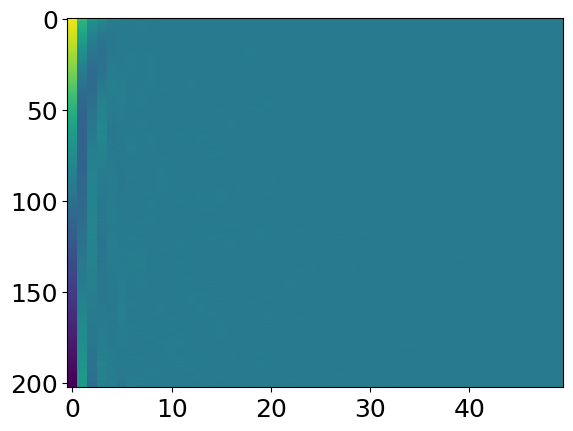

In [72]:
plt.imshow(normss_pca,aspect="auto",interpolation="none")